In [20]:
import shutil
shutil.rmtree('/home/jupyter/datasphere/project/lightning_logs/version_0')

FileNotFoundError: [Errno 2] No such file or directory: '/home/jupyter/datasphere/project/lightning_logs/version_0'

In [1]:
%pip install pytorch_lightning
%pip install segmentation-models-pytorch

Defaulting to user installation because normal site-packages is not writeable

[notice] A new release of pip is available: 23.2.1 -> 23.3.1
[notice] To update, run: python3 -m pip install --upgrade pip
Defaulting to user installation because normal site-packages is not writeable

[notice] A new release of pip is available: 23.2.1 -> 23.3.1
[notice] To update, run: python3 -m pip install --upgrade pip


In [2]:
import torch
import numpy as np
import albumentations as albu
import torchvision
import matplotlib.pyplot as plt
import pytorch_lightning as pl
import segmentation_models_pytorch as smp
from pytorch_lightning.callbacks import ModelCheckpoint

import os
from matplotlib.pyplot import imshow
from PIL import Image
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, Dataset
from torchvision import transforms
from PIL import Image
import os
import numpy as np

Image.MAX_IMAGE_PIXELS = None  # Отключает предупреждение

import warnings
warnings.filterwarnings("ignore")



## Data process

In [3]:
def print_getitem(b):
    fig, axes = plt.subplots(1, 2, figsize=(50, 50))
    axes[0].imshow(b[0].permute(1, 2, 0))
    axes[1].imshow(b[1].squeeze(0), cmap='gray')

In [79]:
def get_training_transform():
    train_transform = [
        albu.HorizontalFlip(p=0.5),
        albu.VerticalFlip(p=0.5),
        albu.RandomRotate90(p=0.5),
        albu.RandomContrast(limit=0.2, p=0.25), 
    ]
    return albu.Compose(train_transform)

In [5]:
class SatelliteDataset(Dataset):
    def __init__(self, root_img='/home/jupyter/datasphere/project/data/img', root_mask='/home/jupyter/datasphere/project/data/mask'):
        self.image_dir = root_img
        self.mask_dir = root_mask
        self.image_names = sorted(i for i in os.listdir(root_img) if 'png' in i)
        self.mask_names = sorted(i for i in os.listdir(root_mask) if 'png' in i)
        
        self.aug = get_training_transform()
        self.post_transform = torchvision.transforms.ToTensor()
        self.post_transform = torchvision.transforms.ToTensor()

    def print_mask(self, item):
        mask = Image.open(os.path.join(self.mask_dir, self.mask_names[item]))
        mask.show()

    def print_img(self, item):
        image = Image.open(os.path.join(self.image_dir, self.image_names[item]))
        image.show()
        
    def print_img_mask(self, item):
        image = Image.open(os.path.join(self.image_dir, self.image_names[item]))
        mask = Image.open(os.path.join(self.mask_dir, self.mask_names[item]))
        
        fig, axes = plt.subplots(1, 2, figsize=(12, 6))
        axes[0].imshow(image)
        axes[0].set_title('Image')
        axes[1].imshow(mask, cmap='gray')
        axes[1].set_title('Mask')
        plt.show()

    def print_mask_on_img(self, item):
        image_path = os.path.join(self.image_dir, self.image_names[item])
        mask_path = os.path.join(self.mask_dir, self.mask_names[item])
        image = Image.open(image_path).convert("RGB")
        mask = Image.open(mask_path).convert("L")
        mask = mask.resize(image.size, Image.NEAREST)
        mask_np = np.array(mask)
        cmap = plt.cm.get_cmap('viridis', 2)
        
        plt.figure(figsize=(10, 5))
        plt.imshow(image)
        plt.imshow(mask_np, cmap=cmap, alpha=0.5, vmin=0, vmax=1)
        plt.title("Image with Overlayed Mask")
        plt.axis("off")
        plt.show()
    
    def __getitem__(self, item):
        image = Image.open(os.path.join(self.image_dir, self.image_names[item])).convert("RGB")
        mask = Image.open(os.path.join(self.mask_dir, self.mask_names[item])).convert("L")
        image = np.array(image)
        mask = np.array(mask)
        
        transformed = self.aug(image=image, mask=mask)
        image, mask = transformed["image"], transformed["mask"]
        image = self.post_transform(image)
        
        return image, torch.tensor(mask).long()

    def __len__(self):
        return len(self.image_names)


In [8]:
df = SatelliteDataset()

In [9]:
len(df)

21

In [10]:
df[0][0].shape

torch.Size([3, 512, 512])

In [44]:
p = df[0]

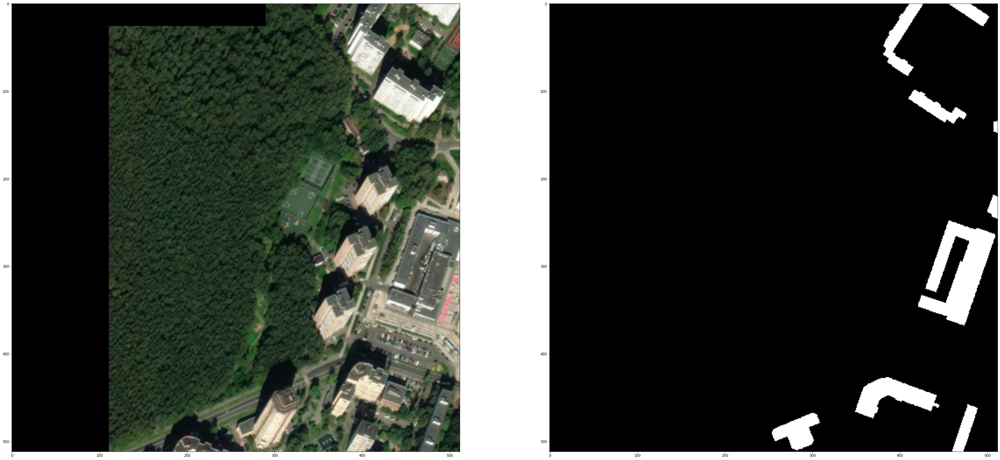

In [15]:
print_getitem(df[0])

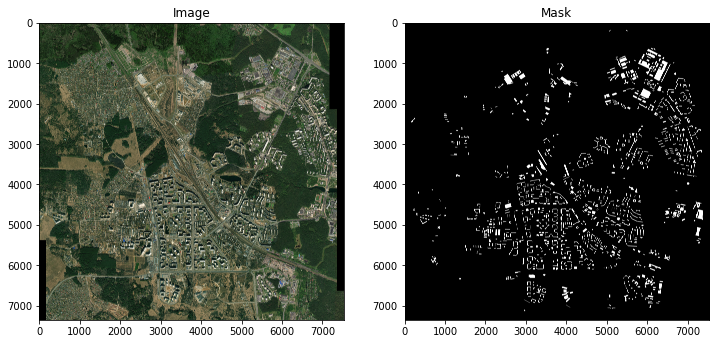

In [46]:
df.print_img_mask(0)

<ipython-input-39-e346f57eb7d9>:38: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap('viridis', 2)


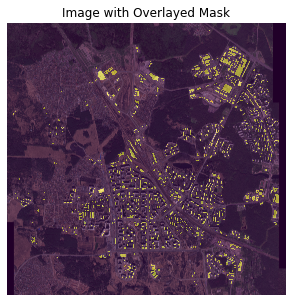

In [47]:
df.print_mask_on_img(0)

## Data process 2

In [80]:
class SatelliteDataset(Dataset):
    def __init__(self, learn = True, root_img='/home/jupyter/datasphere/project/data/img', root_mask='/home/jupyter/datasphere/project/data/mask', patch_size=(512, 512)):
        self.image_dir = root_img
        self.mask_dir = root_mask
        
        self.image_names = sorted(i for i in os.listdir(root_img) if 'png' in i)
        self.mask_names = sorted(i for i in os.listdir(root_mask) if 'png' in i)
        if learn:
            self.image_names = self.image_names[:-2]
            self.mask_names = self.mask_names[:-2]
        else:
            self.image_names = self.image_names[-2:]
            self.mask_names = self.mask_names[-2:]
            
        self.patch_size = patch_size
        
        self.aug = get_training_transform()
        self.post_transform = torchvision.transforms.ToTensor()

        self.cur_image = -1
        self.cur_image_patches = None
        self.cur_mask_patches = None

        self.patches_count = [0 for i in range(len(self.image_names))]
        for i in range(len(self.image_names)):
            image = Image.open(os.path.join(self.image_dir, self.image_names[i])).convert("RGB")
            a = (image.size[0] + self.patch_size[0] - 1) // self.patch_size[0]
            b = (image.size[1] + self.patch_size[1] - 1) // self.patch_size[1]
            self.patches_count[i] = a*b

    def print_mask(self, item):
        mask = Image.open(os.path.join(self.mask_dir, self.mask_names[item]))
        mask.show()

    def print_img(self, item):
        image = Image.open(os.path.join(self.image_dir, self.image_names[item]))
        image.show()
        
    def print_img_mask(self, item):
        image = Image.open(os.path.join(self.image_dir, self.image_names[item]))
        mask = Image.open(os.path.join(self.mask_dir, self.mask_names[item]))
        
        fig, axes = plt.subplots(1, 2, figsize=(12, 6))
        axes[0].imshow(image)
        axes[0].set_title('Image')
        axes[1].imshow(mask, cmap='gray')
        axes[1].set_title('Mask')
        plt.show()

    def print_mask_on_img(self, item):
        image_path = os.path.join(self.image_dir, self.image_names[item])
        mask_path = os.path.join(self.mask_dir, self.mask_names[item])
        image = Image.open(image_path).convert("RGB")
        mask = Image.open(mask_path).convert("L")
        mask = mask.resize(image.size, Image.NEAREST)
        mask_np = np.array(mask)
        cmap = plt.cm.get_cmap('viridis', 2)
        
        plt.figure(figsize=(10, 5))
        plt.imshow(image)
        plt.imshow(mask_np, cmap=cmap, alpha=0.5, vmin=0, vmax=1)
        plt.title("Image with Overlayed Mask")
        plt.axis("off")
        plt.show()
    
    def _split_image_into_patches(self, image, mask, patch_size=(3000, 3000)):
        # image в формате тензора, mask в формате Image
        image_patches = []
        mask_patches = []

        # to_pil = transforms.ToPILImage()
        # image = to_pil(image)

        for i in range(0, image.width, patch_size[0]):
            for j in range(0, image.height, patch_size[1]):
                patch_image = image.crop((i, j, i + patch_size[0], j + patch_size[1]))
                patch_mask = mask.crop((i, j, i + patch_size[0], j + patch_size[1]))

                image_patches.append(patch_image)
                mask_patches.append(patch_mask)
        
        # возвращает списки патчей в формате Image
        return image_patches, mask_patches    
    
    def __getitem__(self, item):
        general_item = 0
        if item >= len(self):
            raise IndexError
        while item >= sum(self.patches_count[:general_item+1]):
            general_item += 1

        if general_item != self.cur_image:
            image = Image.open(os.path.join(self.image_dir, self.image_names[general_item])).convert("RGB")
            mask = Image.open(os.path.join(self.mask_dir, self.mask_names[general_item])).convert("L")
            
            self.cur_image = general_item
            self.cur_image_patches, self.cur_mask_patches = self._split_image_into_patches(image, mask, self.patch_size)

        image_patch = np.array(self.cur_image_patches[item - sum(self.patches_count[:general_item])])
        mask_patch = np.array(self.cur_mask_patches[item - sum(self.patches_count[:general_item])])
        
        transformed = self.aug(image=image_patch, mask=mask_patch)
        image_patch, mask_patch = transformed["image"], transformed["mask"]
        image_patch = self.post_transform(image_patch)
        
        return image_patch, torch.tensor(mask_patch).long()


    def __len__(self):
        # return len(self.image_names)
        return sum(self.patches_count)


In [19]:
df = SatelliteDataset()

In [20]:
len(df)

3422

In [22]:
df[3421][1]

tensor([[0, 0, 0,  ..., 0, 0, 0],
        [0, 0, 0,  ..., 0, 0, 0],
        [0, 0, 0,  ..., 0, 0, 0],
        ...,
        [0, 0, 0,  ..., 0, 0, 0],
        [0, 0, 0,  ..., 0, 0, 0],
        [0, 0, 0,  ..., 0, 0, 0]])

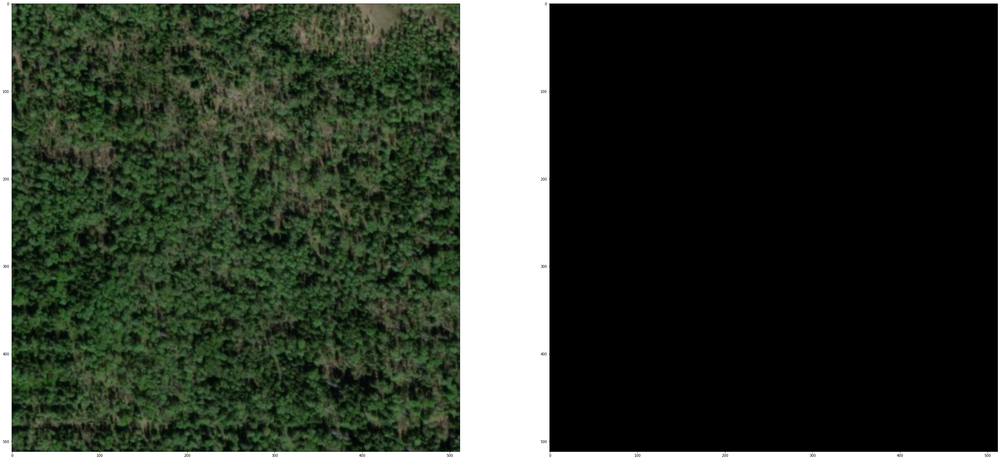

In [24]:
print_getitem(df[0])

## Base model

In [6]:
class DiceLoss(nn.Module):
    def __init__(self, eps = 1e-7):
        super().__init__()
        self.eps = eps

    def forward(self, inputs, targets):
        inputs = torch.nn.functional.softmax(inputs)
        targets = torch.nn.functional.one_hot(targets).permute(0, 3, 1, 2)
        
        if targets.shape[1] == 1:
            one_hot_targets_class_2 = 1 - targets
            targets = torch.cat([targets, one_hot_targets_class_2], dim=1)
            
        inputs = inputs.view(-1)
        targets = targets.contiguous().view(-1)
            
        inter = (inputs * targets).sum()
        union = inputs.sum() + targets.sum()
        dice = (2*inter) / (union + self.eps)
        return 1 - dice


class IoULoss(nn.Module):
    def __init__(self, weight=None, size_average=True):
        super().__init__()

    def forward(self, inputs, targets, smooth=1):
        inputs = torch.nn.functional.softmax(inputs)
        targets = torch.nn.functional.one_hot(targets).permute(0, 3, 1, 2)

        if targets.shape[1] == 1:
            one_hot_targets_class_2 = 1 - targets
            targets = torch.cat([targets, one_hot_targets_class_2], dim=1)

        inputs = inputs.view(-1)
        targets = targets.contiguous().view(-1)
        intersection = (inputs * targets).sum()
        total = (inputs + targets).sum()
        union = total - intersection
        IoU = (intersection + smooth)/(union + smooth)
        return 1 - IoU  


class BCEDiceLoss(nn.Module):
    def __init__(self):
        super().__init__()
        self.bce = nn.BCEWithLogitsLoss()
        self.dice = DiceLoss()

    def forward(self, inputs, targets):
        dice_loss = self.dice(inputs, targets)
        bce_loss = self.bce(inputs, targets)
        return bce_loss + dice_loss


class JaccardBCELoss(nn.Module):
    def __init__(self):
        super().__init__()
        self.bce = nn.BCEWithLogitsLoss()
        self.jaccard = IoULoss()

    def forward(self, inputs, targets):
        jaccard_loss = self.jaccard(inputs, targets)
        bce_loss = self.bce(inputs, targets)
    
        return bce_loss + jaccard_loss

class FocalLoss(nn.Module):
    def __init__(self):
        super().__init__()

    def forward(self, inputs, targets, alpha=0.8, gamma=2.0, smooth=1):
        inputs = torch.nn.functional.softmax(inputs)
        targets = torch.nn.functional.one_hot(targets).permute(0, 3, 1, 2)
        BCE = nn.functional.binary_cross_entropy(inputs, targets)
        BCE_EXP = torch.exp(-BCE)
        focal_loss = alpha*(1-BCE_EXP)**gamma * BCE
        return focal_loss

class JaccardDiceLoss(nn.Module):
    def __init__(self):
        super().__init__()
        self.dice = DiceLoss()
        self.jaccard = IoULoss()

    def forward(self, inputs, targets):
        jaccard_loss = self.jaccard(inputs, targets)
        dice_loss = self.dice(inputs, targets)
        return dice_loss + jaccard_loss

In [7]:
from sklearn.metrics import accuracy_score, f1_score, jaccard_score, precision_score, recall_score, confusion_matrix, roc_auc_score
from operator import add

def calculate_metrics(y_true, y_pred):
    try:
        y_true = y_true.cpu().numpy()
        y_true = y_true > 0.5
        y_true = y_true.astype(np.uint8)
        y_true = y_true.reshape(-1)

        y_pred = y_pred.cpu().numpy()
        y_pred_auc = y_pred.reshape(-1)
        y_pred = y_pred > 0.5
        y_pred = y_pred.astype(np.uint8)
        y_pred = y_pred.reshape(-1)
            
        tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel()

        specificity = tn / (tn+fp)
        sensitivity = tp / (tp + fn)
        score_auc = roc_auc_score(y_true, y_pred_auc)
        score_f1 = 2*tp/(2*tp+fn+fp) 
        score_acc = (tp + tn) / (tp + tn + fn + fp)

        return [specificity, sensitivity, score_auc, score_f1, score_acc]
    except:
        return [0, 0, 0, 0, 0]


In [8]:
def visualize(pred, image): #для теста
    fig, ax = plt.subplots(1, 2, figsize=(15, 30))
    ax[1].imshow(pred)
    ax[2].imshow(image.permute(1, 2, 0))
    plt.show()
    
def visualize_masks(true, pred, image): #для валидации
    fig, ax = plt.subplots(1, 3, figsize=(15, 45))
    ax[0].imshow(true)
    ax[1].imshow(pred)
    ax[2].imshow(image.permute(1, 2, 0))
    plt.show()
    
def my_loss(inputs, targets):
    inputs = torch.nn.functional.softmax(inputs)
    targets = torch.nn.functional.one_hot(targets).permute(0, 3, 1, 2)

    if targets.shape[1] == 1:
        one_hot_targets_class_2 = 1 - targets
        targets = torch.cat([targets, one_hot_targets_class_2], dim=1)

    tp, fp, fn, tn = smp.metrics.get_stats(inputs, targets, mode='multilabel', threshold=0.5)

    # then compute metrics with required reduction (see metric docs)
    iou_score = smp.metrics.iou_score(tp, fp, fn, tn, reduction="micro")
    f1_score_macro = smp.metrics.f1_score(tp, fp, fn, tn, reduction="macro")
    f1_score_micro = smp.metrics.f1_score(tp, fp, fn, tn, reduction="micro")
    #f2_score = smp.metrics.fbeta_score(tp, fp, fn, tn, beta=2, reduction="micro")
    accuracy = smp.metrics.accuracy(tp, fp, fn, tn, reduction="macro")
    recall = smp.metrics.recall(tp, fp, fn, tn, reduction="macro-imagewise")
    precision = smp.metrics.precision(tp, fp, fn, tn, reduction="macro-imagewise")

    print('f1_macro', f1_score_macro)
    print('f1_micro', f1_score_micro)
    print('recall', recall)
    print('precision', precision)

In [37]:
MODELS = {
    "pretrain-unet": smp.Unet,
    "pretrain-deeplab": smp.DeepLabV3Plus,
    "pretrain-fpn" : smp.FPN,
    "pretrain-psp" : smp.PSPNet

}

CRITERIONS = {
    "ce": torch.nn.CrossEntropyLoss(),
    "dice": DiceLoss(),
    "iou": IoULoss()
}

class PLSatelliteDataset(pl.LightningModule):
    def __init__(self, config):
        super().__init__()
        self.save_hyperparameters()
        self._config = config
        self.model = MODELS[config["model_type"]](**config["model_params"])
        self.criterion = CRITERIONS[config["criterion_type"]]
        self.iou = IoULoss()

    def get_dataset(self, learn = True):
        return SatelliteDataset(learn)

    def train_dataloader(self):
        dataset = self.get_dataset()
        params = self._config["dataset_params"]
        return torch.utils.data.DataLoader(
            dataset, params["batch_size"], num_workers=8, shuffle=False,
        )
    
    def test_dataloader(self):
        dataset = self.get_dataset(learn = False)
        params = self._config["dataset_params"]
        return torch.utils.data.DataLoader(
            dataset, batch_size = params["batch_size"], num_workers=8, shuffle=False
        )

    def val_dataloader(self):
        dataset = self.get_dataset(learn = False)
        params = self._config["dataset_params"]
        return torch.utils.data.DataLoader(
            dataset, batch_size = params["batch_size"], num_workers=8, shuffle=False
        )

    def configure_optimizers(self):
        params = self._config["optimizer_params"]
        optimizer = torch.optim.Adam(self.model.parameters(), **params)
        return optimizer

    def training_step(self, batch, batch_idx):
        images, labels = batch
        predicted_heatmaps = self.model(images)
        loss = self.criterion(predicted_heatmaps, labels)
        if batch_idx % 100 == 0:
            print('train',loss)
        self.log("loss", loss)
        return {"loss": loss}
    
    def test_step(self, batch, batch_idx):
        images, labels = batch
        predicted_heatmaps = self.model(images)
        loss = self.criterion(predicted_heatmaps, labels)
        print("test_loss", loss)
        self.log("test_loss", loss)
        
        my_loss(predicted_heatmaps, labels)

        predicted_masks = torch.argmax(predicted_heatmaps, dim=1)
        pred = predicted_masks.detach().cpu()[0]
        true = labels.detach().cpu()[0]
        image = images[0].detach().cpu()
        visualize_masks(true, pred, image)

        iou = self.iou(predicted_heatmaps, labels)
        # iou = compute_iou(predicted_masks.detach().cpu(), labels.detach().cpu())
        print("test_iou", iou)
        self.log("test_iou", iou)
        
        return {"test_loss": loss}
        # return {"test_loss": loss, "test_iou": iou, "specificity": specificity, "sensitivity": sensitivity,
        #       "score_auc": score_auc, "score_f1":score_f1, "score_acc":score_acc}

    def validation_step(self, batch, batch_idx):
        images, labels = batch
        predicted_heatmaps = self.model(images)
        loss = self.criterion(predicted_heatmaps, labels)
        
        my_loss(predicted_heatmaps, labels)
        
        specificity, sensitivity, score_auc, score_f1, score_acc = calculate_metrics(labels, predicted_heatmaps)
#         print({"specificity": specificity, "sensitivity": sensitivity,
#               "score_auc": score_auc, "score_f1":score_f1, "score_acc":score_acc})
        
#         print("val_loss", loss)
        
        self.log("val_loss", loss)
        # predicted_masks = torch.argmax(predicted_heatmaps, dim=1)
        iou = self.iou(predicted_heatmaps, labels)
        # print("val_iou", iou)
        self.log("val_iou", iou)
        return {"val_loss": loss, "val_iou": iou}
    
    def on_epoch_end(self):
        # Сохранение весов модели после каждой эпохи в указанную папку
        save_path = os.path.join("/home/jupyter/datasphere/project/weights", f"model_epoch_{self.current_epoch}.pth")
        torch.save(self.model.state_dict(), save_path)


In [17]:
%reload_ext tensorboard
%tensorboard --logdir logs/

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name      | Type             | Params
-----------------------------------------------
0 | model     | DeepLabV3Plus    | 61.3 M
1 | criterion | CrossEntropyLoss | 0     
2 | iou       | IoULoss          | 0     
-----------------------------------------------
61.3 M    Trainable params
0         Non-trainable params
61.3 M    Total params
245.254   Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

f1_macro tensor(0.0756, device='cuda:0')
f1_micro tensor(0.0818, device='cuda:0')
recall tensor(0.5000, device='cuda:0')
precision tensor(0.5409, device='cuda:0')
f1_macro tensor(0.1274, device='cuda:0')
f1_micro tensor(0.1460, device='cuda:0')
recall tensor(0.5000, device='cuda:0')
precision tensor(0.5730, device='cuda:0')


Training: |          | 0/? [00:00<?, ?it/s]

train tensor(0.8335, device='cuda:0', grad_fn=<NllLoss2DBackward0>)
train tensor(0.1332, device='cuda:0', grad_fn=<NllLoss2DBackward0>)
train tensor(0.1412, device='cuda:0', grad_fn=<NllLoss2DBackward0>)
train tensor(0.1859, device='cuda:0', grad_fn=<NllLoss2DBackward0>)
train tensor(0.0574, device='cuda:0', grad_fn=<NllLoss2DBackward0>)


Validation: |          | 0/? [00:00<?, ?it/s]

f1_macro tensor(0.8399, device='cuda:0')
f1_micro tensor(0.9553, device='cuda:0')
recall tensor(0.8662, device='cuda:0')
precision tensor(0.8225, device='cuda:0')
f1_macro tensor(0.7506, device='cuda:0')
f1_micro tensor(0.9032, device='cuda:0')
recall tensor(0.8315, device='cuda:0')
precision tensor(0.7760, device='cuda:0')
f1_macro tensor(0.7005, device='cuda:0')
f1_micro tensor(0.9309, device='cuda:0')
recall tensor(0.8351, device='cuda:0')
precision tensor(0.7000, device='cuda:0')
f1_macro tensor(0.6948, device='cuda:0')
f1_micro tensor(0.9610, device='cuda:0')
recall tensor(0.8698, device='cuda:0')
precision tensor(0.7094, device='cuda:0')
f1_macro tensor(0.8379, device='cuda:0')
f1_micro tensor(0.9491, device='cuda:0')
recall tensor(0.8154, device='cuda:0')
precision tensor(0.7963, device='cuda:0')
f1_macro tensor(0.7980, device='cuda:0')
f1_micro tensor(0.8976, device='cuda:0')
recall tensor(0.7195, device='cuda:0')
precision tensor(0.8337, device='cuda:0')
f1_macro tensor(0.7942

`Trainer.fit` stopped: `max_epochs=1` reached.
Restoring states from the checkpoint path at /home/jupyter/work/resources/weights/model-dice-epoch=00-val_loss=0.20.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
Loaded model weights from the checkpoint at /home/jupyter/work/resources/weights/model-dice-epoch=00-val_loss=0.20.ckpt


Testing: |          | 0/? [00:00<?, ?it/s]

test_loss tensor(0.1449, device='cuda:0')
f1_macro tensor(0.8342, device='cuda:0')
f1_micro tensor(0.9545, device='cuda:0')
recall tensor(0.8605, device='cuda:0')
precision tensor(0.8200, device='cuda:0')


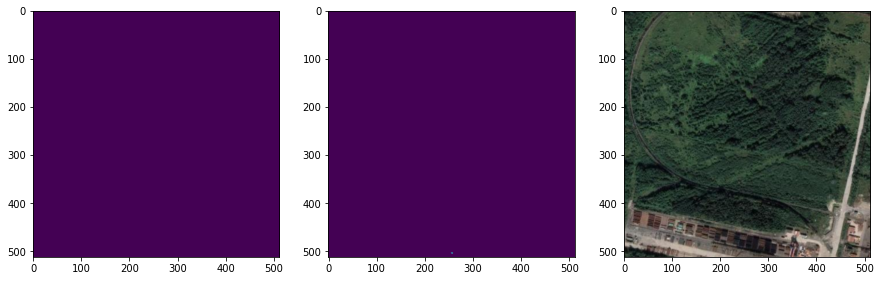

test_iou tensor(0.1980, device='cuda:0')
test_loss tensor(0.2503, device='cuda:0')
f1_macro tensor(0.7504, device='cuda:0')
f1_micro tensor(0.9031, device='cuda:0')
recall tensor(0.8314, device='cuda:0')
precision tensor(0.7760, device='cuda:0')


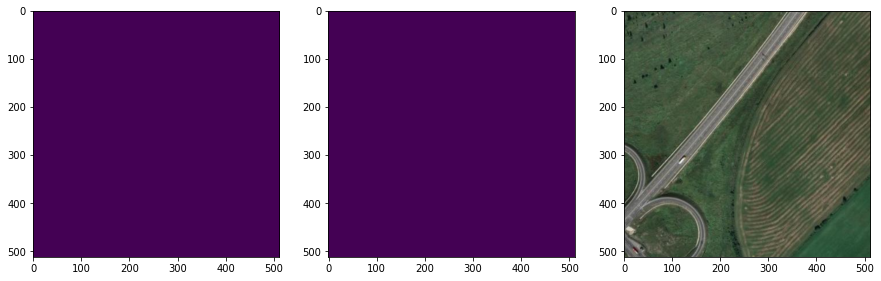

test_iou tensor(0.2585, device='cuda:0')
test_loss tensor(0.1761, device='cuda:0')
f1_macro tensor(0.7688, device='cuda:0')
f1_micro tensor(0.9431, device='cuda:0')
recall tensor(0.8623, device='cuda:0')
precision tensor(0.7190, device='cuda:0')


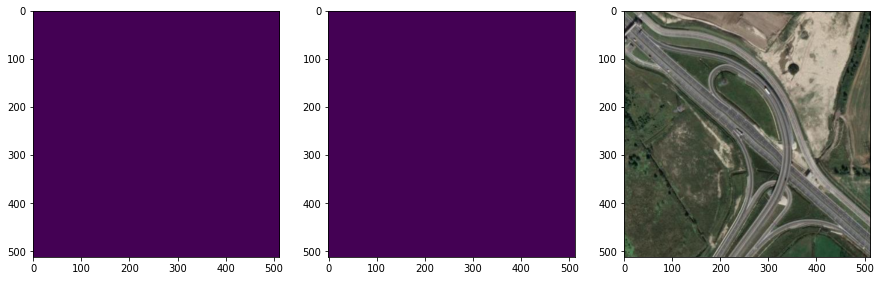

test_iou tensor(0.1814, device='cuda:0')
test_loss tensor(0.1491, device='cuda:0')
f1_macro tensor(0.6977, device='cuda:0')
f1_micro tensor(0.9612, device='cuda:0')
recall tensor(0.8714, device='cuda:0')
precision tensor(0.7094, device='cuda:0')


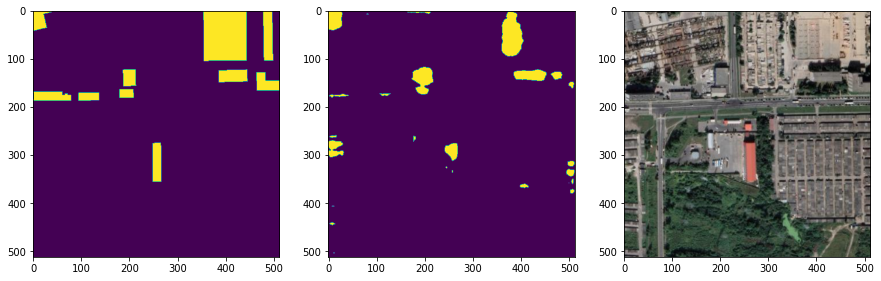

test_iou tensor(0.1279, device='cuda:0')
test_loss tensor(0.1628, device='cuda:0')
f1_macro tensor(0.8487, device='cuda:0')
f1_micro tensor(0.9514, device='cuda:0')
recall tensor(0.8027, device='cuda:0')
precision tensor(0.7968, device='cuda:0')


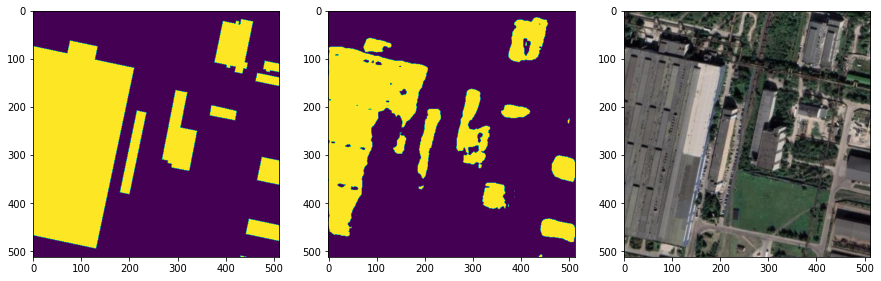

test_iou tensor(0.2183, device='cuda:0')
test_loss tensor(0.2667, device='cuda:0')
f1_macro tensor(0.7980, device='cuda:0')
f1_micro tensor(0.8976, device='cuda:0')
recall tensor(0.7195, device='cuda:0')
precision tensor(0.8337, device='cuda:0')


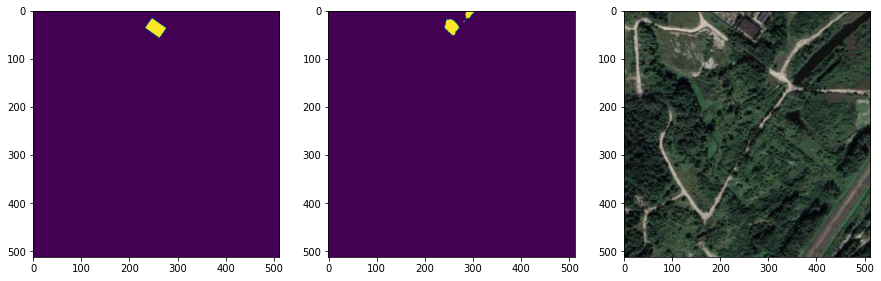

test_iou tensor(0.3101, device='cuda:0')
test_loss tensor(0.2224, device='cuda:0')
f1_macro tensor(0.7988, device='cuda:0')
f1_micro tensor(0.9175, device='cuda:0')
recall tensor(0.8232, device='cuda:0')
precision tensor(0.8311, device='cuda:0')


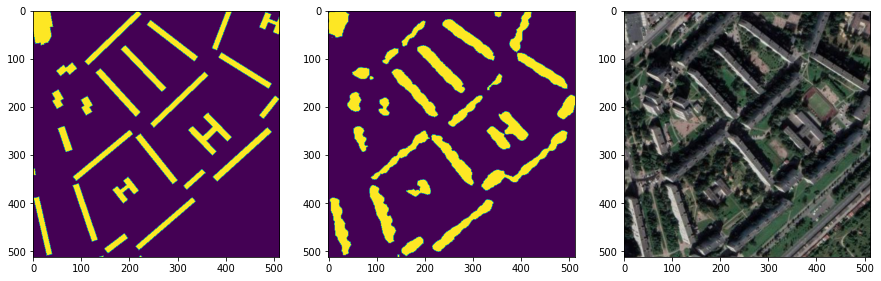

test_iou tensor(0.2668, device='cuda:0')
test_loss tensor(0.1913, device='cuda:0')
f1_macro tensor(0.7521, device='cuda:0')
f1_micro tensor(0.9348, device='cuda:0')
recall tensor(0.7395, device='cuda:0')
precision tensor(0.8056, device='cuda:0')


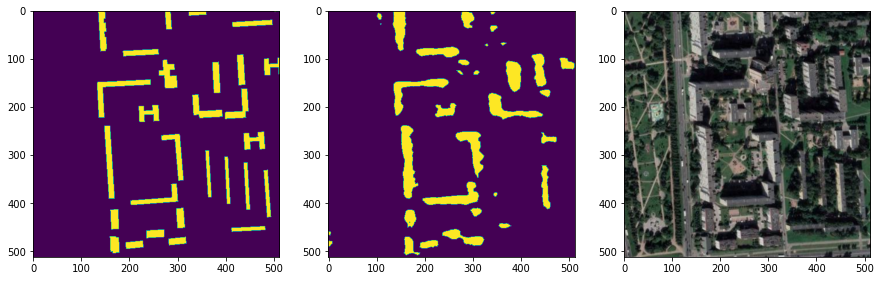

test_iou tensor(0.2362, device='cuda:0')
test_loss tensor(0.2254, device='cuda:0')
f1_macro tensor(0.7957, device='cuda:0')
f1_micro tensor(0.9169, device='cuda:0')
recall tensor(0.7771, device='cuda:0')
precision tensor(0.8160, device='cuda:0')


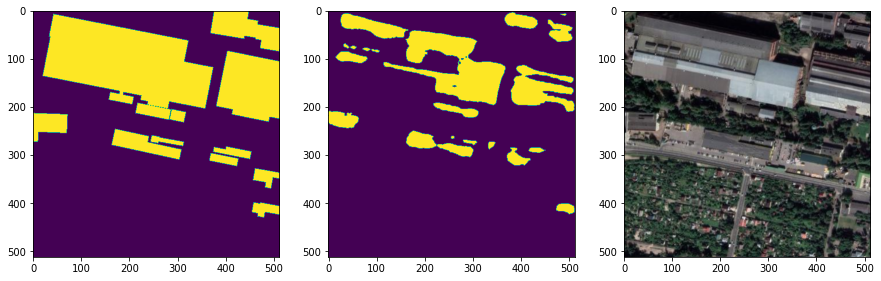

test_iou tensor(0.2837, device='cuda:0')
test_loss tensor(0.1534, device='cuda:0')
f1_macro tensor(0.8062, device='cuda:0')
f1_micro tensor(0.9554, device='cuda:0')
recall tensor(0.7848, device='cuda:0')
precision tensor(0.8441, device='cuda:0')


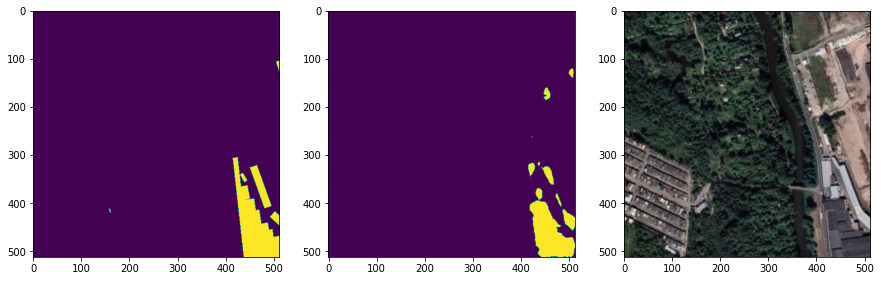

test_iou tensor(0.2065, device='cuda:0')
test_loss tensor(0.2678, device='cuda:0')
f1_macro tensor(0.7707, device='cuda:0')
f1_micro tensor(0.9060, device='cuda:0')
recall tensor(0.7120, device='cuda:0')
precision tensor(0.8115, device='cuda:0')


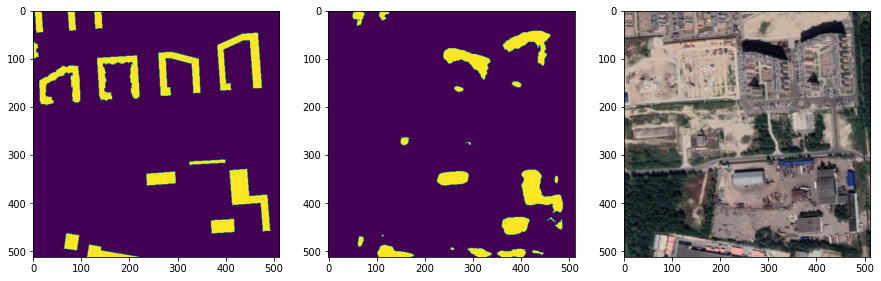

test_iou tensor(0.3239, device='cuda:0')
test_loss tensor(0.1626, device='cuda:0')
f1_macro tensor(0.8216, device='cuda:0')
f1_micro tensor(0.9524, device='cuda:0')
recall tensor(0.8051, device='cuda:0')
precision tensor(0.7367, device='cuda:0')


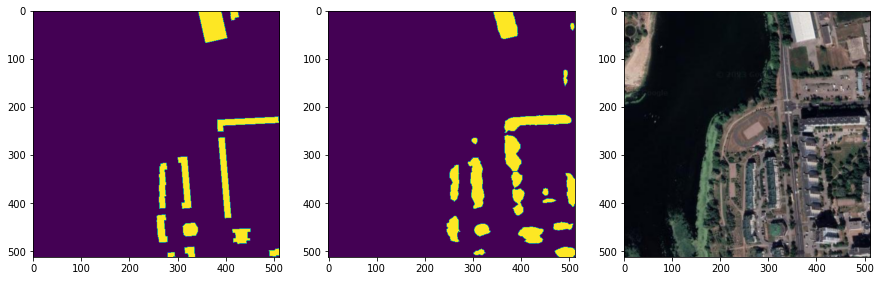

test_iou tensor(0.2268, device='cuda:0')
test_loss tensor(0.2063, device='cuda:0')
f1_macro tensor(0.7770, device='cuda:0')
f1_micro tensor(0.9315, device='cuda:0')
recall tensor(0.7896, device='cuda:0')
precision tensor(0.7082, device='cuda:0')


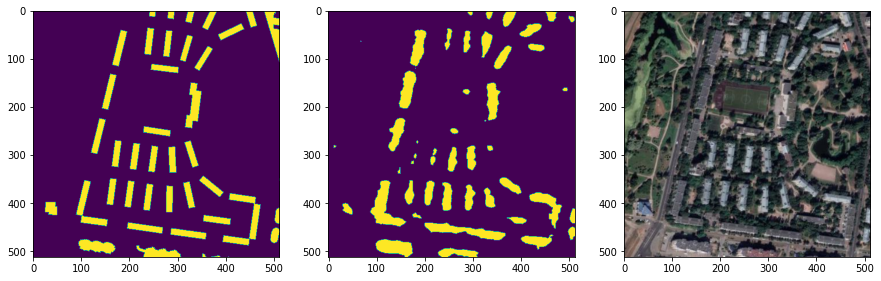

test_iou tensor(0.2750, device='cuda:0')
test_loss tensor(0.1247, device='cuda:0')
f1_macro tensor(0.7826, device='cuda:0')
f1_micro tensor(0.9617, device='cuda:0')
recall tensor(0.8309, device='cuda:0')
precision tensor(0.8701, device='cuda:0')


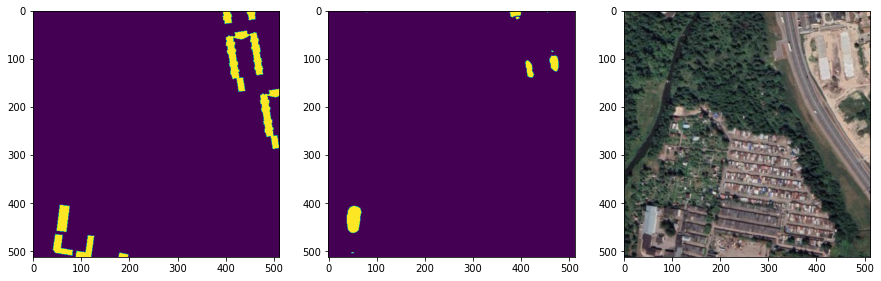

test_iou tensor(0.1756, device='cuda:0')
test_loss tensor(0.0310, device='cuda:0')
f1_macro tensor(0.5824, device='cuda:0')
f1_micro tensor(0.9970, device='cuda:0')
recall tensor(0.8901, device='cuda:0')
precision tensor(0.8768, device='cuda:0')


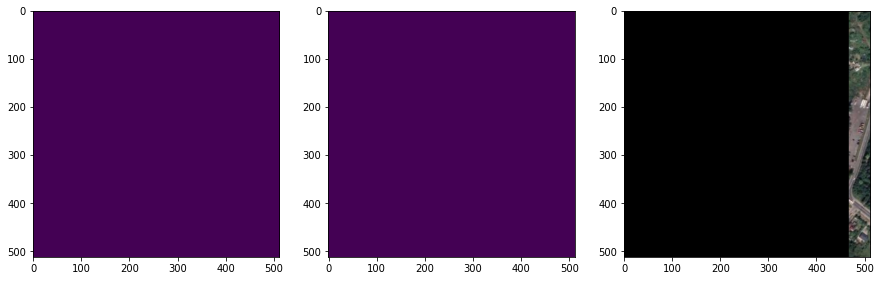

test_iou tensor(0.0543, device='cuda:0')
test_loss tensor(0.2058, device='cuda:0')
f1_macro tensor(0.7048, device='cuda:0')
f1_micro tensor(0.9599, device='cuda:0')
recall tensor(0.8781, device='cuda:0')
precision tensor(0.5770, device='cuda:0')


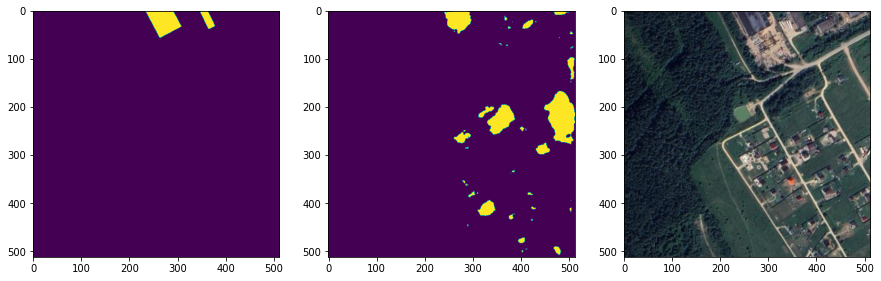

test_iou tensor(0.2919, device='cuda:0')
test_loss tensor(0.1945, device='cuda:0')
f1_macro tensor(0.7658, device='cuda:0')
f1_micro tensor(0.9605, device='cuda:0')
recall tensor(0.8728, device='cuda:0')
precision tensor(0.7345, device='cuda:0')


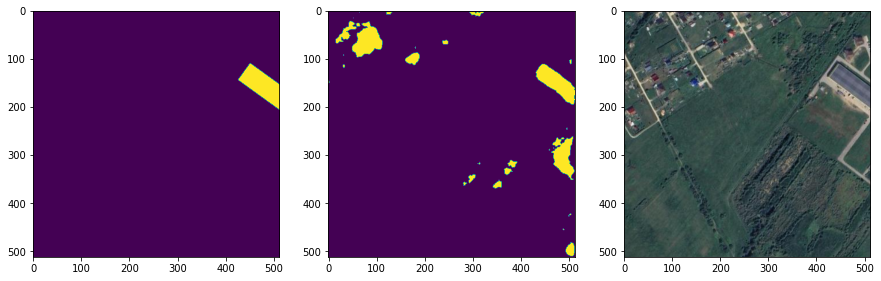

test_iou tensor(0.2776, device='cuda:0')
test_loss tensor(0.2114, device='cuda:0')
f1_macro tensor(0.8078, device='cuda:0')
f1_micro tensor(0.9595, device='cuda:0')
recall tensor(0.8303, device='cuda:0')
precision tensor(0.7194, device='cuda:0')


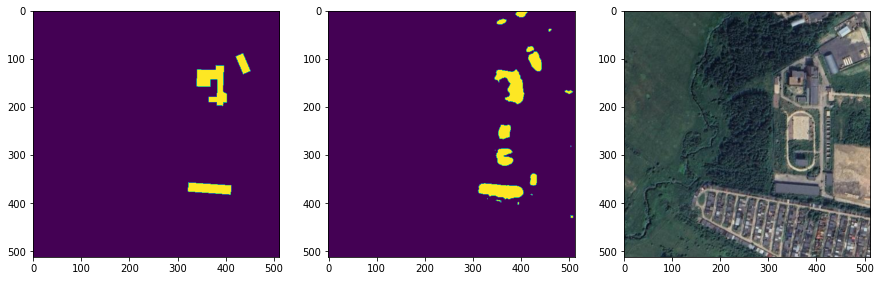

test_iou tensor(0.2954, device='cuda:0')
test_loss tensor(0.2652, device='cuda:0')
f1_macro tensor(0.8164, device='cuda:0')
f1_micro tensor(0.9355, device='cuda:0')
recall tensor(0.8482, device='cuda:0')
precision tensor(0.7779, device='cuda:0')


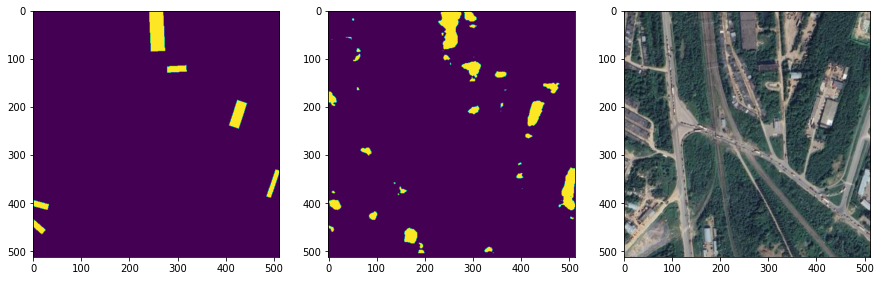

test_iou tensor(0.3453, device='cuda:0')
test_loss tensor(0.2984, device='cuda:0')
f1_macro tensor(0.8139, device='cuda:0')
f1_micro tensor(0.9150, device='cuda:0')
recall tensor(0.8338, device='cuda:0')
precision tensor(0.8019, device='cuda:0')


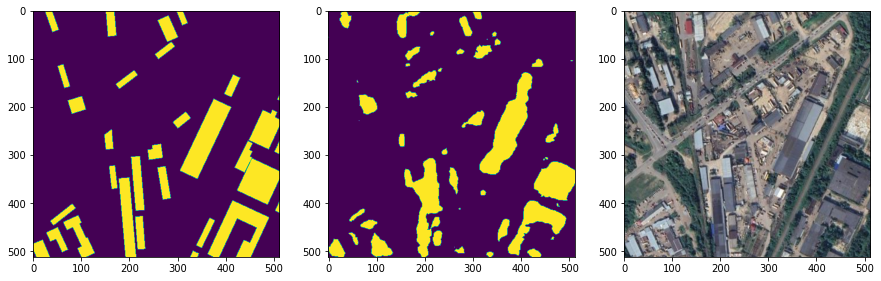

test_iou tensor(0.3766, device='cuda:0')
test_loss tensor(0.3314, device='cuda:0')
f1_macro tensor(0.7764, device='cuda:0')
f1_micro tensor(0.8996, device='cuda:0')
recall tensor(0.7935, device='cuda:0')
precision tensor(0.7522, device='cuda:0')


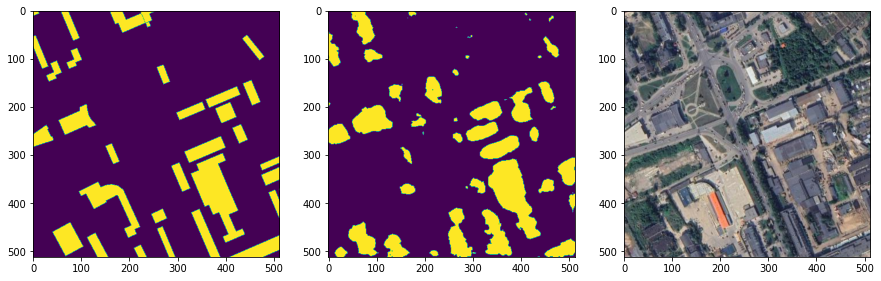

test_iou tensor(0.4070, device='cuda:0')
test_loss tensor(0.2343, device='cuda:0')
f1_macro tensor(0.7968, device='cuda:0')
f1_micro tensor(0.9495, device='cuda:0')
recall tensor(0.8780, device='cuda:0')
precision tensor(0.8295, device='cuda:0')


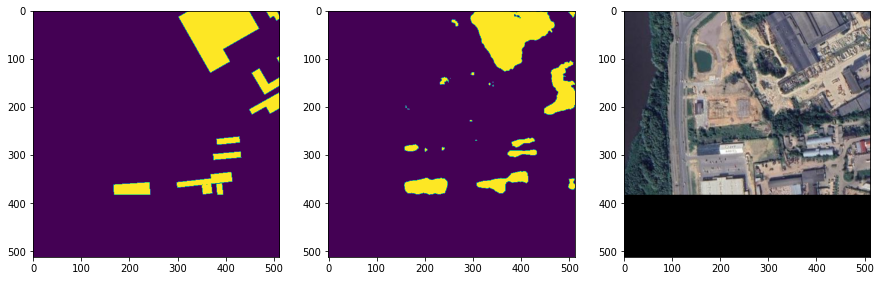

test_iou tensor(0.3217, device='cuda:0')
test_loss tensor(0.1333, device='cuda:0')
f1_macro tensor(0.7703, device='cuda:0')
f1_micro tensor(0.9910, device='cuda:0')
recall tensor(0.8561, device='cuda:0')
precision tensor(0.8716, device='cuda:0')


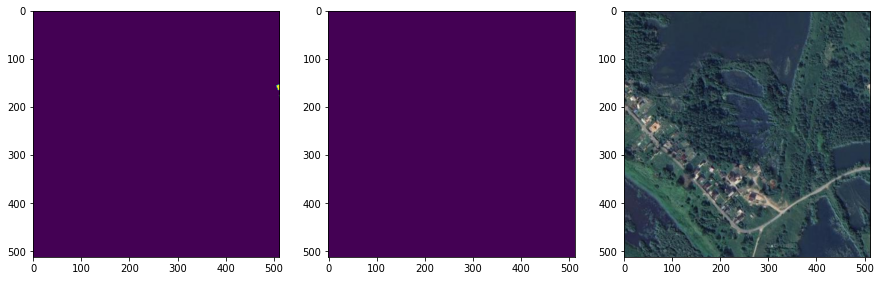

test_iou tensor(0.2128, device='cuda:0')
test_loss tensor(0.1861, device='cuda:0')
f1_macro tensor(0.8066, device='cuda:0')
f1_micro tensor(0.9734, device='cuda:0')
recall tensor(0.6805, device='cuda:0')
precision tensor(0.6971, device='cuda:0')


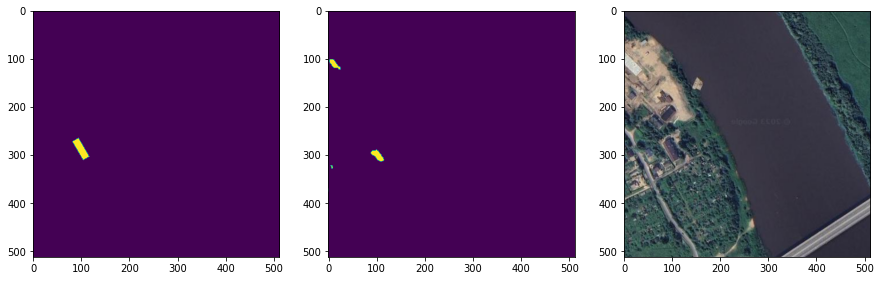

test_iou tensor(0.2724, device='cuda:0')
test_loss tensor(0.2103, device='cuda:0')
f1_macro tensor(0.7570, device='cuda:0')
f1_micro tensor(0.9498, device='cuda:0')
recall tensor(0.8066, device='cuda:0')
precision tensor(0.7296, device='cuda:0')


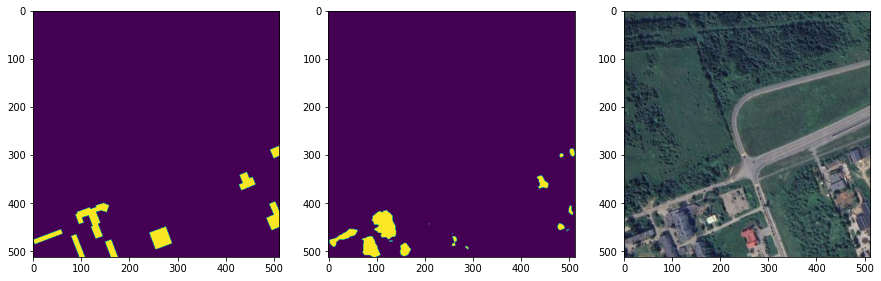

test_iou tensor(0.2908, device='cuda:0')
test_loss tensor(0.1457, device='cuda:0')
f1_macro tensor(0.7516, device='cuda:0')
f1_micro tensor(0.9696, device='cuda:0')
recall tensor(0.8902, device='cuda:0')
precision tensor(0.8404, device='cuda:0')


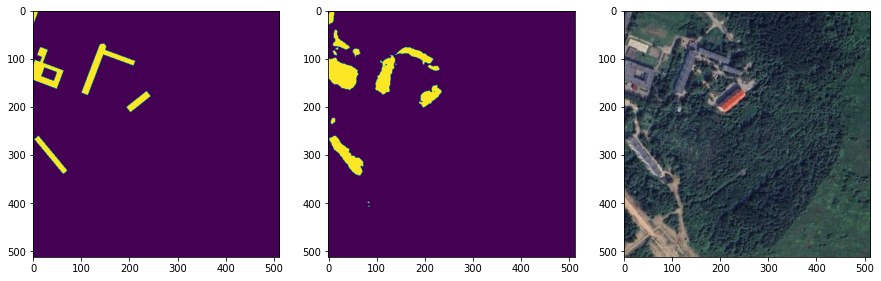

test_iou tensor(0.2141, device='cuda:0')
test_loss tensor(0.1011, device='cuda:0')
f1_macro tensor(0.7052, device='cuda:0')
f1_micro tensor(0.9917, device='cuda:0')
recall tensor(0.9468, device='cuda:0')
precision tensor(0.7165, device='cuda:0')


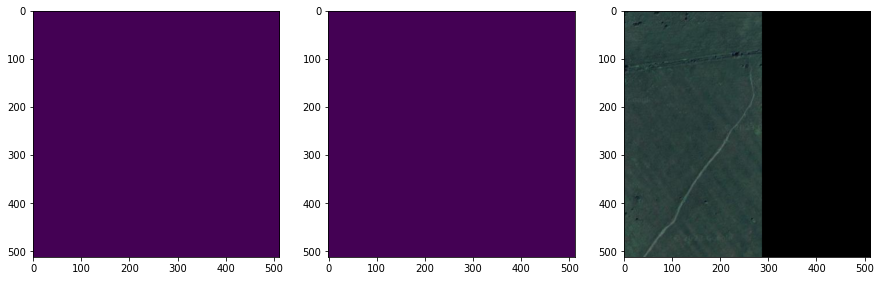

test_iou tensor(0.1649, device='cuda:0')


┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_iou          │    0.25442439317703247    │
│         test_loss         │    0.19674256443977356    │
└───────────────────────────┴───────────────────────────┘

[{'test_loss': 0.19674256443977356, 'test_iou': 0.25442439317703247}]

In [38]:
config = {
    "model_type": "pretrain-deeplab", #"pretrain-deeplab", "pretrain-unet"
    "model_params": {
        "classes": 2,
        "encoder_name": 'resnet152',
        #"encoder_weights": "imagenet",
        "activation": None
    },
    "criterion_type": "ce",
    "optimizer_params": {
        "lr": 0.0001
    },
    "dataset_params": {
        "batch_size": 8,
    }
}


# Определите колбэк ModelCheckpoint
checkpoint_callback = ModelCheckpoint(
    monitor='val_loss',
    dirpath='/home/jupyter/datasphere/project/weights',
    filename='model-dice-{epoch:02d}-{val_loss:.2f}',
    save_top_k=1,
    mode='min',
)


module = PLSatelliteDataset(config)
# model.model.load_state_dict(torch.load(saved_weights_path))

# model = PLSatelliteDataset.load_from_checkpoint(checkpoint_path='/home/jupyter/datasphere/project/weights/model-dice-epoch=00-val_loss=0.21.ckpt')

#logger = pl.loggers.TensorBoardLogger("./logs", name='dice')
trainer = pl.Trainer(
    accelerator="gpu",#"gpu",
    #logger=logger,
    log_every_n_steps=10,
    max_epochs=1,
    default_root_dir="/home/jupyter/datasphere/project/",
    callbacks=[checkpoint_callback],
)
trainer.fit(module)
trainer.test()

## NET 2

In [9]:
import math
import torch
import torch.nn as nn


class TransEncoder(nn.Module):
    def __init__(self, channel, num_head, num_layer, num_patches, use_pos_embed):
        super(TransEncoder, self).__init__()
        self.channel = channel
        self.use_pos_embed = use_pos_embed
        translayer = nn.TransformerEncoderLayer(d_model=channel, nhead=num_head)
        self.trans = nn.TransformerEncoder(translayer, num_layers=num_layer)
        if self.use_pos_embed:
            self.pos_embed = nn.Parameter(torch.zeros(1, num_patches, channel))
            nn.init.trunc_normal_(self.pos_embed, std=0.02)

    def forward(self, x):
        h, w = x.shape[2], x.shape[3]
        if self.use_pos_embed:
            x = x.flatten(2).transpose(1, 2) + self.pos_embed
        else:
            x = x.flatten(2).transpose(1, 2)
        x = self.trans(x)
        x = x.transpose(1, 2).view(-1, self.channel, int(h), int(w))
        return x


class h_sigmoid(nn.Module):
    def __init__(self, inplace=True):
        super(h_sigmoid, self).__init__()
        self.relu = nn.ReLU6(inplace=inplace)

    def forward(self, x):
        return self.relu(x + 3) / 6


class h_swish(nn.Module):
    def __init__(self, inplace=True):
        super(h_swish, self).__init__()
        self.sigmoid = h_sigmoid(inplace=inplace)

    def forward(self, x):
        return x * self.sigmoid(x)


class CoordAtt(nn.Module):
    def __init__(self, inp, oup, reduction=32):
        super(CoordAtt, self).__init__()
        self.pool_h = nn.AdaptiveAvgPool2d((None, 1))
        self.pool_w = nn.AdaptiveAvgPool2d((1, None))

        mip = max(8, inp // reduction)

        self.conv1 = nn.Conv2d(inp, mip, kernel_size=1, stride=1, padding=0)
        self.bn1 = nn.BatchNorm2d(mip)
        self.act = h_swish()

        self.conv_h = nn.Conv2d(mip, oup, kernel_size=1, stride=1, padding=0)
        self.conv_w = nn.Conv2d(mip, oup, kernel_size=1, stride=1, padding=0)

    def forward(self, x):
        identity = x

        n, c, h, w = x.size()
        x_h = self.pool_h(x)
        x_w = self.pool_w(x).permute(0, 1, 3, 2)

        y = torch.cat([x_h, x_w], dim=2)
        y = self.conv1(y)
        y = self.bn1(y)
        y = self.act(y)

        x_h, x_w = torch.split(y, [h, w], dim=2)
        x_w = x_w.permute(0, 1, 3, 2)

        a_h = self.conv_h(x_h).sigmoid()
        a_w = self.conv_w(x_w).sigmoid()

        out = identity * a_w * a_h

        return out


class CBAM(nn.Module):
    def __init__(self, in_channel):
        super(CBAM, self).__init__()
        self.Cam = ChannelAttentionModul(in_channel=in_channel)  # 通道注意力模块
        self.Sam = SpatialAttentionModul(in_channel=in_channel)  # 空间注意力模块

    def forward(self, x):
        out = self.Cam(x)
        out = self.Sam(out)
        x = torch.cat([out, x], 1)
        return x


class ChannelAttentionModul(nn.Module):  # 通道注意力模块
    def __init__(self, in_channel, r=0.5):  # channel为输入的维度, r为全连接层缩放比例->控制中间层个数
        super(ChannelAttentionModul, self).__init__()
        # 全局最大池化
        self.MaxPool = nn.AdaptiveMaxPool2d(1)

        self.fc_MaxPool = nn.Sequential(
            nn.Linear(in_channel, int(in_channel * r)),  # int(channel * r)取整数, 中间层神经元数至少为1, 如有必要可设为向上取整
            nn.ReLU(),
            nn.Linear(int(in_channel * r), in_channel),
            nn.Sigmoid(),
        )

        # 全局均值池化
        self.AvgPool = nn.AdaptiveAvgPool2d(1)

        self.fc_AvgPool = nn.Sequential(
            nn.Linear(in_channel, int(in_channel * r)),  # int(channel * r)取整数, 中间层神经元数至少为1, 如有必要可设为向上取整
            nn.ReLU(),
            nn.Linear(int(in_channel * r), in_channel),
            nn.Sigmoid(),
        )

        # 激活函数
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        # 1.最大池化分支
        max_branch = self.MaxPool(x)
        # 送入MLP全连接神经网络, 得到权重
        max_in = max_branch.view(max_branch.size(0), -1)
        max_weight = self.fc_MaxPool(max_in)

        # 2.全局池化分支
        avg_branch = self.AvgPool(x)
        # 送入MLP全连接神经网络, 得到权重
        avg_in = avg_branch.view(avg_branch.size(0), -1)
        avg_weight = self.fc_AvgPool(avg_in)

        # MaxPool + AvgPool 激活后得到权重weight
        weight = max_weight + avg_weight
        weight = self.sigmoid(weight)

        # 将维度为b, c的weight, reshape成b, c, 1, 1 与 输入x 相乘
        h, w = weight.shape
        # 通道注意力Mc
        Mc = torch.reshape(weight, (h, w, 1, 1))

        # 乘积获得结果
        x = Mc * x

        return x


class SpatialAttentionModul(nn.Module):  # 空间注意力模块
    def __init__(self, in_channel):
        super(SpatialAttentionModul, self).__init__()
        self.conv = nn.Conv2d(2, 1, 7, padding=3)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        # x维度为 [N, C, H, W] 沿着维度C进行操作, 所以dim=1, 结果为[N, H, W]
        MaxPool = torch.max(x, dim=1).values  # torch.max 返回的是索引和value， 要用.values去访问值才行！
        AvgPool = torch.mean(x, dim=1)

        # 增加维度, 变成 [N, 1, H, W]
        MaxPool = torch.unsqueeze(MaxPool, dim=1)
        AvgPool = torch.unsqueeze(AvgPool, dim=1)

        # 维度拼接 [N, 2, H, W]
        x_cat = torch.cat((MaxPool, AvgPool), dim=1)  # 获得特征图

        # 卷积操作得到空间注意力结果
        x_out = self.conv(x_cat)
        Ms = self.sigmoid(x_out)

        # 与原图通道进行乘积
        x = Ms * x

        return x


class ChannelAttention(nn.Module):
    def __init__(self):
        super(ChannelAttention, self).__init__()
        self.beta = torch.nn.Parameter(torch.FloatTensor(1), requires_grad=True)
        self.beta.data.fill_(0.)
        self.softmax = nn.Softmax(dim=2)

    def forward(self, x):
        b, c, h, w = x.size()
        X = self.softmax(torch.matmul(x.view(b, c, h * w), x.view(b, c, h * w).transpose(1, 2)))
        X = torch.matmul(X.transpose(1, 2), x.view(b, c, h * w)).view(b, c, h, w)
        X = self.beta * X + x

        return X


if __name__ == '__main__':
    x = torch.Tensor(1, 256, 64, 64)
    # layer = CBAM(in_channel=256)
    layer = TransEncoder(256, num_head=4, num_layer=6, num_patches=16, use_pos_embed=False)
    y = layer(x)
    print(y.shape)

torch.Size([1, 256, 64, 64])


In [10]:
import torch
import torch._utils
import torch.nn as nn
import torch.nn.functional as F
from torch.hub import load_state_dict_from_url
import sys


BN_MOMENTUM = 0.1


def conv3x3(in_planes, out_planes, stride=1):
    return nn.Conv2d(in_planes, out_planes, kernel_size=3, stride=stride, padding=1, bias=False)


class BasicBlock(nn.Module):
    expansion = 1
    def __init__(self, inplanes, planes, stride=1, downsample=None):
        super(BasicBlock, self).__init__()
        self.conv1  = conv3x3(inplanes, planes, stride)
        self.bn1    = nn.BatchNorm2d(planes, momentum=BN_MOMENTUM)
        self.relu   = nn.ReLU(inplace=True)
        self.conv2  = conv3x3(planes, planes)
        self.bn2    = nn.BatchNorm2d(planes, momentum=BN_MOMENTUM)
        self.downsample = downsample
        self.stride = stride

        self.attention = CoordAtt(planes, planes)

    def forward(self, x):
        residual = x

        out = self.conv1(x)
        out = self.bn1(out)
        out = self.relu(out)

        out = self.conv2(out)
        out = self.bn2(out)

        out = self.attention(out)

        if self.downsample is not None:
            residual = self.downsample(x)

        out = out + residual
        out = self.relu(out)

        return out


class Bottleneck(nn.Module):
    expansion = 4
    def __init__(self, inplanes, planes, stride=1, downsample=None):
        super(Bottleneck, self).__init__()
        self.conv1  = nn.Conv2d(inplanes, planes, kernel_size=3, padding=2, dilation=2, bias=False)
        self.bn1    = nn.BatchNorm2d(planes, momentum=BN_MOMENTUM)
        self.conv2  = nn.Conv2d(planes, planes, kernel_size=3, padding=2, dilation=2, bias=False)
        self.bn2    = nn.BatchNorm2d(planes, momentum=BN_MOMENTUM)
        self.conv3  = nn.Conv2d(planes, planes, kernel_size=3, stride=stride,
                               padding=1, bias=False)
        self.bn3    = nn.BatchNorm2d(planes, momentum=BN_MOMENTUM)
        self.conv4  = nn.Conv2d(planes, planes * self.expansion, kernel_size=1,
                               bias=False)
        self.bn4    = nn.BatchNorm2d(planes * self.expansion,
                               momentum=BN_MOMENTUM)
        self.relu   = nn.ReLU(inplace=True)
        self.downsample = downsample
        self.stride = stride

        self.attention = CoordAtt(planes * self.expansion, planes * self.expansion)

    def forward(self, x):
        residual = x

        out = self.conv1(x)
        out = self.bn1(out)
        out = self.relu(out)
        
        out = self.conv2(out)
        out = self.bn2(out)
        out = self.relu(out)

        out = self.conv3(out)
        out = self.bn3(out)
        out = self.relu(out)

        out = self.conv4(out)
        out = self.bn4(out)

        out = self.attention(out)

        if self.downsample is not None:
            residual = self.downsample(x)

        out = out + residual
        out = self.relu(out)

        return out


class HighResolutionModule(nn.Module):
    def __init__(self, num_branches, blocks, num_blocks, num_inchannels,
                 num_channels, multi_scale_output=True):
        super(HighResolutionModule, self).__init__()
        self.num_inchannels = num_inchannels
        self.num_branches   = num_branches

        self.multi_scale_output = multi_scale_output

        self.branches       = self._make_branches(num_branches, blocks, num_blocks, num_channels)
        self.fuse_layers    = self._make_fuse_layers()
        self.relu           = nn.ReLU(inplace=True)

    def _make_one_branch(self, branch_index, block, num_blocks, num_channels, stride=1):
        """
       一个分支的 Sequential 结构
       :param branch_index: 第几个 branch
       :param block: 类型
       :param num_blocks: 重复次数, cfg 每个 branch 设置的次数都 = 4
       :param num_channels: channel
       :param stride:
       :return:
        """
        downsample = None
        if stride != 1 or self.num_inchannels[branch_index] != num_channels[branch_index] * block.expansion:
            downsample = nn.Sequential(
                nn.Conv2d(self.num_inchannels[branch_index], num_channels[branch_index] * block.expansion, kernel_size=1, stride=stride, bias=False),
                nn.BatchNorm2d(num_channels[branch_index] * block.expansion, momentum=BN_MOMENTUM),
            )

        layers = []
        layers.append(block(self.num_inchannels[branch_index], num_channels[branch_index], stride, downsample))
        self.num_inchannels[branch_index] = num_channels[branch_index] * block.expansion
        for i in range(1, num_blocks[branch_index]):
            layers.append(block(self.num_inchannels[branch_index], num_channels[branch_index]))

        return nn.Sequential(*layers)

    def _make_branches(self, num_branches, block, num_blocks, num_channels):
        branches = []

        for branch_index in range(num_branches):
            branches.append(self._make_one_branch(branch_index, block, num_blocks, num_channels))

        return nn.ModuleList(branches)

    def _make_fuse_layers(self):
        if self.num_branches == 1:
            return None

        fuse_layers = []
        for i in range(self.num_branches if self.multi_scale_output else 1):
            fuse_layer = []
            for j in range(self.num_branches):
                if j > i:   # ↗, 深 -> 浅, 通道转换，上采样 (forward 完成)
                    fuse_layer.append(nn.Sequential(
                        nn.Conv2d(self.num_inchannels[j], self.num_inchannels[i], 1, 1, 0, bias=False),
                        nn.BatchNorm2d(self.num_inchannels[i], momentum=BN_MOMENTUM)))
                elif j == i:    # → 同层
                    fuse_layer.append(None)
                else:   # ↘, 浅 -> 深, 下采样
                    conv3x3s = []
                    for k in range(i - j):
                        if k == i - j - 1:  # 下采样次数
                            conv3x3s.append(
                                nn.Sequential(
                                    nn.Conv2d(self.num_inchannels[j], self.num_inchannels[i], 3, 2, 1, bias=False),
                                    nn.BatchNorm2d(self.num_inchannels[i], momentum=BN_MOMENTUM)
                                )
                            )
                        else:
                            conv3x3s.append(
                                nn.Sequential(
                                    nn.Conv2d(self.num_inchannels[j], self.num_inchannels[j], 3, 2, 1, bias=False),
                                    nn.BatchNorm2d(self.num_inchannels[j], momentum=BN_MOMENTUM),
                                    nn.ReLU(inplace=True)
                                )
                            )
                    fuse_layer.append(nn.Sequential(*conv3x3s))
            fuse_layers.append(nn.ModuleList(fuse_layer))

        return nn.ModuleList(fuse_layers)

    def get_num_inchannels(self):
        return self.num_inchannels

    def forward(self, x):
        if self.num_branches == 1:
            return [self.branches[0](x[0])]

        for i in range(self.num_branches):
            x[i] = self.branches[i](x[i])

        x_fuse = []
        for i in range(len(self.fuse_layers)):
            y = 0
            # y = x[0] if i == 0 else self.fuse_layers[i][0](x[0])
            for j in range(0, self.num_branches):
                if j > i:
                    width_output    = x[i].shape[-1]
                    height_output   = x[i].shape[-2]
                    y = y + F.interpolate(
                        self.fuse_layers[i][j](x[j]),
                        size=[height_output, width_output],
                        mode='bilinear', align_corners=True
                    )
                elif i == j:
                    y = y + x[j]
                else:
                    y = y + self.fuse_layers[i][j](x[j])
            x_fuse.append(self.relu(y))

        return x_fuse


class HighResolutionNet_Classification(nn.Module):
    def __init__(self, num_classes, backbone):
        super(HighResolutionNet_Classification, self).__init__()
        num_filters = {
            'hrnetv2_w18' : [18, 36, 72, 144],
            'hrnetv2_w32' : [32, 64, 128, 256],
            'hrnetv2_w48' : [48, 96, 192, 384],
        }[backbone]
        # stem net
        self.conv1  = nn.Conv2d(3, 64, kernel_size=3, stride=2, padding=1, bias=False)
        self.bn1    = nn.BatchNorm2d(64, momentum=BN_MOMENTUM)
        self.conv2  = nn.Conv2d(64, 64, kernel_size=3, stride=2, padding=1, bias=False)
        self.bn2    = nn.BatchNorm2d(64, momentum=BN_MOMENTUM)
        self.relu   = nn.ReLU(inplace=True)

        self.layer1 = self._make_layer(Bottleneck, 64, 64, 4)

        pre_stage_channels              = [Bottleneck.expansion * 64]
        num_channels                    = [num_filters[0], num_filters[1]]
        self.transition1                = self._make_transition_layer(pre_stage_channels, num_channels)
        self.stage2, pre_stage_channels = self._make_stage(1, 2, BasicBlock, [4, 4], num_channels, num_channels)

        num_channels                    = [num_filters[0], num_filters[1], num_filters[2]]
        self.transition2                = self._make_transition_layer(pre_stage_channels, num_channels)
        self.stage3, pre_stage_channels = self._make_stage(4, 3, BasicBlock, [4, 4, 4], num_channels, num_channels)

        num_channels                    = [num_filters[0], num_filters[1], num_filters[2], num_filters[3]]
        self.transition3                = self._make_transition_layer(pre_stage_channels, num_channels)
        self.stage4, pre_stage_channels = self._make_stage(3, 4, BasicBlock, [4, 4, 4, 4], num_channels, num_channels)

        self.pre_stage_channels         = pre_stage_channels

        self.incre_modules, self.downsamp_modules, self.final_layer = self._make_head(Bottleneck, pre_stage_channels)

        self.classifier = nn.Linear(2048, num_classes)

    def _make_layer(self, block, inplanes, planes, num_blocks, stride=1):
        downsample = None
        if stride != 1 or inplanes != planes * block.expansion:
            downsample = nn.Sequential(
                nn.Conv2d(inplanes, planes * block.expansion, kernel_size=1, stride=stride, bias=False),
                nn.BatchNorm2d(planes * block.expansion, momentum=BN_MOMENTUM),
            )

        layers = []
        layers.append(block(inplanes, planes, stride, downsample))
        inplanes = planes * block.expansion
        for i in range(1, num_blocks):
            layers.append(block(inplanes, planes))

        return nn.Sequential(*layers)

    def _make_transition_layer(self, num_inchannels, num_channels):
        """
        :param num_channels_pre_layer: pre_stage output channels list
        :param num_channels_cur_layer: cur_stage output channels list
            cur 总比 pre 多一个 output_channel 对应增加的 1/2 下采样
                    stage2      stage3          stage4
            pre:    [256]       [48,96]         [48,96,192]
            cur:    [48,96]     [48,96,192]     [48,96,192,384]

            每个 stage channels 数量也对应了 stage2/3/4 使用 BASIC block; expansion=1
        :return:
            transition_layers:
                1.完成 pre_layer 到 cur_layer input channels 数量对应
                2.完成 feature map 尺寸对应
        """
        num_branches_pre = len(num_inchannels)
        num_branches_cur = len(num_channels)

        transition_layers = []
        for i in range(num_branches_cur):
            if i < num_branches_pre:
                if num_channels[i] != num_inchannels[i]:
                    transition_layers.append(nn.Sequential(
                        nn.Conv2d(num_inchannels[i], num_channels[i], 3, 1, 1, bias=False),
                        nn.BatchNorm2d(num_channels[i], momentum=BN_MOMENTUM),
                        nn.ReLU(inplace=True)
                    ))
                else:
                    transition_layers.append(None)
            else:
                conv3x3s = [
                    nn.Sequential(
                        nn.Conv2d(num_inchannels[-1], num_channels[i], 3, 2, 1, bias=False),
                        nn.BatchNorm2d(num_channels[i], momentum=BN_MOMENTUM),
                        nn.ReLU(inplace=True)
                    )
                ]
                transition_layers.append(nn.Sequential(*conv3x3s))

        return nn.ModuleList(transition_layers)

    def _make_stage(self, num_modules, num_branches, block, num_blocks, num_inchannels, num_channels, multi_scale_output=True):
        modules = []
        for i in range(num_modules):
            modules.append(
                HighResolutionModule(num_branches, block, num_blocks, num_inchannels, num_channels, multi_scale_output)
            )
            num_inchannels = modules[-1].get_num_inchannels()

        return nn.Sequential(*modules), num_inchannels

    def _make_head(self, block, pre_stage_channels):
        head_channels = [32, 64, 128, 256]

        incre_modules = []
        for i, channels  in enumerate(pre_stage_channels):
            incre_module = self._make_layer(block, channels, head_channels[i], 1, stride=1)
            incre_modules.append(incre_module)
        incre_modules = nn.ModuleList(incre_modules)
            
        downsamp_modules = []
        for i in range(len(pre_stage_channels)-1):
            in_channels = head_channels[i] * block.expansion
            out_channels = head_channels[i+1] * block.expansion

            downsamp_module = nn.Sequential(
                nn.Conv2d(in_channels=in_channels, out_channels=out_channels, kernel_size=3, stride=2, padding=1),
                nn.BatchNorm2d(out_channels, momentum=BN_MOMENTUM),
                nn.ReLU(inplace=True)
            )

            downsamp_modules.append(downsamp_module)
        downsamp_modules = nn.ModuleList(downsamp_modules)

        final_layer = nn.Sequential(
            nn.Conv2d(
                in_channels=head_channels[3] * block.expansion,
                out_channels=2048,
                kernel_size=1,
                stride=1,
                padding=0
            ),
            nn.BatchNorm2d(2048, momentum=BN_MOMENTUM),
            nn.ReLU(inplace=True)
        )

        return incre_modules, downsamp_modules, final_layer

    def forward(self, x):
        # The stem part
        x = self.conv1(x)
        x = self.bn1(x)
        x = self.relu(x)
        x = self.conv2(x)
        x = self.bn2(x)
        x = self.relu(x)
        x = self.layer1(x)

        # The stage 1 to 2
        x_list = []
        for i in range(2):
            if self.transition1[i] is not None:
                x_list.append(self.transition1[i](x))
            else:
                x_list.append(x)
        y_list = self.stage2(x_list)

        # The stage 2 to 3
        x_list = []
        for i in range(3):
            if self.transition2[i] is not None:
                if i < 2:
                    x_list.append(self.transition2[i](y_list[i]))
                else:
                    x_list.append(self.transition2[i](y_list[-1]))
            else:
                x_list.append(y_list[i])
        y_list = self.stage3(x_list)

        # The stage 3 to 4
        x_list = []
        for i in range(4):
            if self.transition3[i] is not None:
                if i < 3:
                    x_list.append(self.transition3[i](y_list[i]))
                else:
                    x_list.append(self.transition3[i](y_list[-1]))
            else:
                x_list.append(y_list[i])
        y_list = self.stage4(x_list)

        y = self.incre_modules[0](y_list[0])
        for i in range(len(self.downsamp_modules)):
            y = self.incre_modules[i+1](y_list[i+1]) + \
                        self.downsamp_modules[i](y)

        y = self.final_layer(y)

        if torch._C._get_tracing_state():
            y = y.flatten(start_dim=2).mean(dim=2)
        else:
            y = F.avg_pool2d(y, kernel_size=y.size()
                                 [2:]).view(y.size(0), -1)

        y = self.classifier(y)

        return y


def hrnet_classification(pretrained=False, backbone='hrnetv2_w18'):
    model = HighResolutionNet_Classification(num_classes=1000, backbone=backbone)
    if pretrained:
        model_urls = {
            'hrnetv2_w18' : "https://github.com/bubbliiiing/hrnet-pytorch/releases/download/v1.0/hrnetv2_w18_imagenet_pretrained.pth",
            'hrnetv2_w32' : "https://github.com/bubbliiiing/hrnet-pytorch/releases/download/v1.0/hrnetv2_w32_imagenet_pretrained.pth",
            'hrnetv2_w48' : "https://github.com/bubbliiiing/hrnet-pytorch/releases/download/v1.0/hrnetv2_w48_imagenet_pretrained.pth",
        }
        state_dict = load_state_dict_from_url(model_urls[backbone], model_dir="./model_data")
        model.load_state_dict(state_dict)

    return model


if __name__ == '__main__':
    x = torch.Tensor(1, 3, 512, 512)
    net = HighResolutionNet_Classification(num_classes=21, backbone='hrnetv2_w48')
    y = net(x)
    print(y.shape)

torch.Size([1, 21])


In [11]:
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import sys


class Down_Sampling(nn.Module):
    def __init__(self, in_channels, out_channles):
        super(Down_Sampling, self).__init__()
        self.conv1 = nn.Conv2d(in_channels, out_channles, kernel_size=3, stride=2, padding=1)
        self.bn1 = nn.BatchNorm2d(out_channles)
        self.conv2 = nn.Conv2d(out_channles, out_channles, kernel_size=3, padding=1)
        self.bn2 = nn.BatchNorm2d(out_channles)
        self.relu = nn.ReLU()

        self.CA = ChannelAttention()

    def forward(self, x):
        out = self.relu(self.bn1(self.conv1(x)))
        out = self.bn2(self.conv2(out))

        out = self.CA(out)
        out = self.relu(out)

        return out


class Down_T_Sampling(nn.Module):
    def __init__(self, in_channels, out_channles):
        super(Down_T_Sampling, self).__init__()
        self.conv1 = nn.Conv2d(in_channels, out_channles, kernel_size=3, stride=2, padding=1)
        self.bn1 = nn.BatchNorm2d(out_channles)
        self.conv2 = nn.Conv2d(out_channles, out_channles, kernel_size=3, padding=1)
        self.bn2 = nn.BatchNorm2d(out_channles)
        self.relu = nn.ReLU()

        self.TA = TransEncoder(out_channles, num_head=4, num_layer=6, num_patches=16, use_pos_embed=False)

    def forward(self, x):
        out = self.relu(self.bn1(self.conv1(x)))
        out = self.bn2(self.conv2(out))

        out = self.TA(out)
        out = self.relu(out)

        return out


class HRnet_Backbone(nn.Module):
    def __init__(self, backbone='hrnetv2_w18', pretrained=False):
        super(HRnet_Backbone, self).__init__()
        self.model    = hrnet_classification(backbone=backbone, pretrained=pretrained)
        del self.model.incre_modules
        del self.model.downsamp_modules
        del self.model.final_layer
        del self.model.classifier

        pre_channel1 = np.int_(self.model.pre_stage_channels[0])
        self.DSP1 = Down_Sampling(in_channels=64*4, out_channles=pre_channel1*2)
        pre_channel2 = np.int_(self.model.pre_stage_channels[1])
        self.DSP2 = Down_Sampling(in_channels=pre_channel2, out_channles=pre_channel2*2)
        pre_channel3 = np.int_(self.model.pre_stage_channels[2])
        self.DSP3 = Down_T_Sampling(in_channels=pre_channel3, out_channles=pre_channel3*2)

    def forward(self, x):
        # The stem part
        x = self.model.conv1(x)
        x = self.model.bn1(x)
        x = self.model.relu(x)
        x = self.model.conv2(x)
        x = self.model.bn2(x)
        x = self.model.relu(x)
        x = self.model.layer1(x)

        # The stage 1 to 2
        x_list = []
        for i in range(2):
            if self.model.transition1[i] is not None:
                x_list.append(self.model.transition1[i](x))
            else:
                x_list.append(x)
        y_list = self.model.stage2(x_list)

        _, c1, h1, w1 = x.shape
        _, c2, h2, w2 = y_list[-1].shape
        # down_sample1 = Down_Sampling(c1, c2//2)(x)
        down_sample1 = self.DSP1(x)
        y_list[-1] = torch.add(down_sample1, y_list[-1])

        # The stage 2 to 3
        x_list = []
        for i in range(3):
            if self.model.transition2[i] is not None:
                if i < 2:
                    x_list.append(self.model.transition2[i](y_list[i]))
                else:
                    x_list.append(self.model.transition2[i](y_list[-1]))
            else:
                x_list.append(y_list[i])
        y_list = self.model.stage3(x_list)

        _, c3, h3, w3 = down_sample1.shape
        # down_sample2 = Down_Sampling(c3, c3)(down_sample1)
        down_sample2 = self.DSP2(down_sample1)
        y_list[-1] = torch.add(down_sample2, y_list[-1])

        # The stage 3 to 4
        x_list = []
        for i in range(4):
            if self.model.transition3[i] is not None:
                if i < 3:
                    x_list.append(self.model.transition3[i](y_list[i]))
                else:
                    x_list.append(self.model.transition3[i](y_list[-1]))
            else:
                x_list.append(y_list[i])
        y_list = self.model.stage4(x_list)

        _, c4, h4, w4 = down_sample2.shape
        # down_sample3 = Down_Sampling(c4, c4)(down_sample2)
        down_sample3 = self.DSP3(down_sample2)
        y_list[-1] = torch.add(down_sample3, y_list[-1])
        
        return y_list


class HRnet(nn.Module):
    def __init__(self, num_classes=2, backbone='hrnetv2_w48', pretrained=False):
        super(HRnet, self).__init__()
        self.backbone       = HRnet_Backbone(backbone=backbone, pretrained=pretrained)

        last_inp_channels   = np.int_(np.sum(self.backbone.model.pre_stage_channels))

        self.last_layer = nn.Sequential(
            nn.Conv2d(in_channels=last_inp_channels, out_channels=last_inp_channels, kernel_size=1, stride=1, padding=0),
            nn.BatchNorm2d(last_inp_channels, momentum=BN_MOMENTUM),
            nn.ReLU(inplace=True),
            nn.Conv2d(in_channels=last_inp_channels, out_channels=num_classes, kernel_size=1, stride=1, padding=0)
        )

        inp_channel1 = np.int_(self.backbone.model.pre_stage_channels[-1])
        self.CA1 = CoordAtt(inp=inp_channel1, oup=inp_channel1)
        inp_channel2 = np.int_(np.sum(self.backbone.model.pre_stage_channels[:-3:-1]))
        self.CA2 = CoordAtt(inp=inp_channel2, oup=inp_channel2)
        inp_channel3 = np.int_(np.sum(self.backbone.model.pre_stage_channels[:-4:-1]))
        self.CA3 = CoordAtt(inp=inp_channel3, oup=inp_channel3)

        self.Tconv3 = nn.ConvTranspose2d(inp_channel1, inp_channel1, kernel_size=4, stride=2, padding=1)
        self.Tconv2 = nn.ConvTranspose2d(inp_channel2, inp_channel2, kernel_size=4, stride=2, padding=1)
        self.Tconv1 = nn.ConvTranspose2d(inp_channel3, inp_channel3, kernel_size=4, stride=2, padding=1)

    def forward(self, inputs):
        H, W = inputs.size(2), inputs.size(3)
        x = self.backbone(inputs)
        
        # Upsampling + attention
        # x3_c, x3_h, x3_w = x[3].size(1), x[3].size(2), x[3].size(3)
        # x3 = CoordAtt(x3_c, x3_c)(x[3])
        x3 = self.CA1(x[3])

        x2_c, x2_h, x2_w = x[2].size(1), x[2].size(2), x[2].size(3)
        # x3 = F.interpolate(x3, size=(x2_h, x2_w), mode='bilinear', align_corners=True)
        x3 = self.Tconv3(x3)
        out3 = torch.cat([x[2], x3], 1)

        x1_c, x1_h, x1_w = x[1].size(1), x[1].size(2), x[1].size(3)
        # x2 = CoordAtt(out3.size(1), out3.size(1))(out3)
        x2 = self.CA2(out3)
        # x2 = F.interpolate(x2, size=(x1_h, x1_w), mode='bilinear', align_corners=True)
        x2 = self.Tconv2(x2)
        out2 = torch.cat([x[1], x2], 1)

        x0_c, x0_h, x0_w = x[0].size(1), x[0].size(2), x[0].size(3)
        # x1 = CoordAtt(out2.size(1), out2.size(1))(out2)
        x1 = self.CA3(out2)
        # x1 = F.interpolate(x1, size=(x0_h, x0_w), mode='bilinear', align_corners=True)
        x1 = self.Tconv1(x1)
        out = torch.cat([x[0], x1], 1)

        x = self.last_layer(out)
        x = F.interpolate(x, size=(H, W), mode='bilinear', align_corners=True)
        return x


if __name__ == '__main__':
    net = HRnet()
    x = torch.Tensor(1, 3, 512, 512)
    out = net(x)
    print(out.shape)

torch.Size([1, 2, 512, 512])


In [98]:
weights = torch.tensor([1.0, 2.0]) 

CRITERIONS = {
    "ce": torch.nn.CrossEntropyLoss(), #weight=torch.tensor([1.0, 3.0])
    "dice": DiceLoss(),
    "iou": IoULoss(),
    "jaccar": JaccardDiceLoss(),
}

class ChaniseSatelliteDataset(pl.LightningModule):
    def __init__(self, config):
        super().__init__()
        self.save_hyperparameters()
        self._config = config
        self.model = HRnet()
        self.criterion = CRITERIONS[config["criterion_type"]]
        self.iou = IoULoss()
        
        self.losss = []

    def get_dataset(self, learn = True):
        return SatelliteDataset(learn)
    
    def forward(self, x):
        predicted_heatmaps = self.model(x)
        return predicted_heatmaps

    def train_dataloader(self):
        dataset = self.get_dataset()
        params = self._config["dataset_params"]
        return torch.utils.data.DataLoader(
            dataset, params["batch_size"], num_workers=8, shuffle=False,
        )
    
    def test_dataloader(self):
        dataset = self.get_dataset(learn = False)
        params = self._config["dataset_params"]
        return torch.utils.data.DataLoader(
            dataset, batch_size = params["batch_size"], num_workers=8, shuffle=False
        )

    def val_dataloader(self):
        dataset = self.get_dataset(learn = False)
        params = self._config["dataset_params"]
        return torch.utils.data.DataLoader(
            dataset, batch_size = params["batch_size"], num_workers=8, shuffle=False
        )

    def configure_optimizers(self):
        params = self._config["optimizer_params"]
        optimizer = torch.optim.Adam(self.model.parameters(), **params)
        return optimizer

    def training_step(self, batch, batch_idx):
        images, labels = batch
        predicted_heatmaps = self.model(images)
        loss = self.criterion(predicted_heatmaps, labels)
        if batch_idx % 100 == 0:
            print('train',loss)
        self.log("loss", loss)
        return {"loss": loss}
    
    def my_loss(self, inputs, targets):
        inputs = torch.nn.functional.softmax(inputs)
        targets = torch.nn.functional.one_hot(targets).permute(0, 3, 1, 2)

        if targets.shape[1] == 1:
            one_hot_targets_class_2 = 1 - targets
            targets = torch.cat([targets, one_hot_targets_class_2], dim=1)

        tp, fp, fn, tn = smp.metrics.get_stats(inputs, targets, mode='multilabel', threshold=0.5)
        self.losss.append(smp.metrics.f1_score(tp, fp, fn, tn, reduction="macro"))

    
    def test_step(self, batch, batch_idx):
        images, labels = batch
        predicted_heatmaps = self.model(images)
        loss = self.criterion(predicted_heatmaps, labels)
        print("test_loss", loss)
        self.log("test_loss", loss)
        
        self.my_loss(predicted_heatmaps, labels)
        print(sum(self.losss)/len(self.losss))

        predicted_masks = torch.argmax(predicted_heatmaps, dim=1)
        pred = predicted_masks.detach().cpu()[0]
        true = labels.detach().cpu()[0]
        image = images[0].detach().cpu()
        visualize_masks(true, pred, image)

        iou = self.iou(predicted_heatmaps, labels)
        # iou = compute_iou(predicted_masks.detach().cpu(), labels.detach().cpu())
        print("test_iou", iou)
        self.log("test_iou", iou)
        
        return {"test_loss": loss}
        # return {"test_loss": loss, "test_iou": iou, "specificity": specificity, "sensitivity": sensitivity,
        #       "score_auc": score_auc, "score_f1":score_f1, "score_acc":score_acc}

    def validation_step(self, batch, batch_idx):
        images, labels = batch
        predicted_heatmaps = self.model(images)
        loss = self.criterion(predicted_heatmaps, labels)
        print(sum(self.losss)/len(self.losss) if len(self.losss)!=0 else 0)
        self.my_loss(predicted_heatmaps, labels)
        
        
        specificity, sensitivity, score_auc, score_f1, score_acc = calculate_metrics(labels, predicted_heatmaps)
#         print({"specificity": specificity, "sensitivity": sensitivity,
#               "score_auc": score_auc, "score_f1":score_f1, "score_acc":score_acc})
        
#         print("val_loss", loss)
        
        self.log("val_loss", loss)
        # predicted_masks = torch.argmax(predicted_heatmaps, dim=1)
        iou = self.iou(predicted_heatmaps, labels)
        # print("val_iou", iou)
        self.log("val_iou", iou)
        return {"val_loss": loss, "val_iou": iou}
    
    def on_epoch_end(self):
        self.losss = []
        # Сохранение весов модели после каждой эпохи в указанную папку
        save_path = os.path.join("/home/jupyter/datasphere/project/weights", f"model_china_{self.current_epoch}.pth")
        torch.save(self.model.state_dict(), save_path)


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name      | Type             | Params
-----------------------------------------------
0 | model     | HRnet            | 97.7 M
1 | criterion | CrossEntropyLoss | 0     
2 | iou       | IoULoss          | 0     
-----------------------------------------------
97.7 M    Trainable params
0         Non-trainable params
97.7 M    Total params
390.704   Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

tensor(0.5787, device='cuda:0')
tensor(0.5795, device='cuda:0')


Training: |          | 0/? [00:00<?, ?it/s]

train tensor(0.0441, device='cuda:0', grad_fn=<NllLoss2DBackward0>)
train tensor(0.0807, device='cuda:0', grad_fn=<NllLoss2DBackward0>)
train tensor(0.1774, device='cuda:0', grad_fn=<NllLoss2DBackward0>)
train tensor(0.3067, device='cuda:0', grad_fn=<NllLoss2DBackward0>)
train tensor(0.0670, device='cuda:0', grad_fn=<NllLoss2DBackward0>)


Validation: |          | 0/? [00:00<?, ?it/s]

tensor(0.5803, device='cuda:0')
tensor(0.5802, device='cuda:0')
tensor(0.5807, device='cuda:0')
tensor(0.5813, device='cuda:0')
tensor(0.5820, device='cuda:0')
tensor(0.5821, device='cuda:0')
tensor(0.5821, device='cuda:0')
tensor(0.5824, device='cuda:0')
tensor(0.5834, device='cuda:0')
tensor(0.5839, device='cuda:0')
tensor(0.5843, device='cuda:0')
tensor(0.5845, device='cuda:0')
tensor(0.5845, device='cuda:0')
tensor(0.5850, device='cuda:0')
tensor(0.5855, device='cuda:0')
tensor(0.5857, device='cuda:0')
tensor(0.5858, device='cuda:0')
tensor(0.5857, device='cuda:0')
tensor(0.5855, device='cuda:0')
tensor(0.5852, device='cuda:0')
tensor(0.5847, device='cuda:0')
tensor(0.5843, device='cuda:0')
tensor(0.5839, device='cuda:0')
tensor(0.5835, device='cuda:0')
tensor(0.5831, device='cuda:0')
tensor(0.5829, device='cuda:0')
tensor(0.5827, device='cuda:0')
train tensor(0.0425, device='cuda:0', grad_fn=<NllLoss2DBackward0>)
train tensor(0.0657, device='cuda:0', grad_fn=<NllLoss2DBackward0>)


Validation: |          | 0/? [00:00<?, ?it/s]

tensor(0.5831, device='cuda:0')
tensor(0.5828, device='cuda:0')
tensor(0.5827, device='cuda:0')
tensor(0.5827, device='cuda:0')
tensor(0.5830, device='cuda:0')
tensor(0.5829, device='cuda:0')
tensor(0.5828, device='cuda:0')
tensor(0.5827, device='cuda:0')
tensor(0.5830, device='cuda:0')
tensor(0.5831, device='cuda:0')
tensor(0.5832, device='cuda:0')
tensor(0.5831, device='cuda:0')
tensor(0.5829, device='cuda:0')
tensor(0.5829, device='cuda:0')
tensor(0.5831, device='cuda:0')
tensor(0.5832, device='cuda:0')
tensor(0.5830, device='cuda:0')
tensor(0.5829, device='cuda:0')
tensor(0.5826, device='cuda:0')
tensor(0.5821, device='cuda:0')
tensor(0.5816, device='cuda:0')
tensor(0.5811, device='cuda:0')
tensor(0.5806, device='cuda:0')
tensor(0.5801, device='cuda:0')
tensor(0.5798, device='cuda:0')
tensor(0.5794, device='cuda:0')
tensor(0.5792, device='cuda:0')
train tensor(0.0382, device='cuda:0', grad_fn=<NllLoss2DBackward0>)
train tensor(0.0548, device='cuda:0', grad_fn=<NllLoss2DBackward0>)


Validation: |          | 0/? [00:00<?, ?it/s]

tensor(0.5796, device='cuda:0')
tensor(0.5794, device='cuda:0')
tensor(0.5793, device='cuda:0')
tensor(0.5793, device='cuda:0')
tensor(0.5797, device='cuda:0')
tensor(0.5796, device='cuda:0')
tensor(0.5795, device='cuda:0')
tensor(0.5795, device='cuda:0')
tensor(0.5800, device='cuda:0')
tensor(0.5802, device='cuda:0')
tensor(0.5804, device='cuda:0')
tensor(0.5803, device='cuda:0')
tensor(0.5801, device='cuda:0')
tensor(0.5802, device='cuda:0')
tensor(0.5804, device='cuda:0')
tensor(0.5800, device='cuda:0')
tensor(0.5800, device='cuda:0')
tensor(0.5799, device='cuda:0')
tensor(0.5797, device='cuda:0')
tensor(0.5794, device='cuda:0')
tensor(0.5790, device='cuda:0')
tensor(0.5787, device='cuda:0')
tensor(0.5783, device='cuda:0')
tensor(0.5779, device='cuda:0')
tensor(0.5778, device='cuda:0')
tensor(0.5775, device='cuda:0')


`Trainer.fit` stopped: `max_epochs=3` reached.


tensor(0.5772, device='cuda:0')


Restoring states from the checkpoint path at /home/jupyter/work/resources/weights/model-china-epoch=00-val_loss=1.81.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
Loaded model weights from the checkpoint at /home/jupyter/work/resources/weights/model-china-epoch=00-val_loss=1.81.ckpt


Testing: |          | 0/? [00:00<?, ?it/s]

test_loss tensor(1.1606, device='cuda:0')
tensor(0.5779, device='cuda:0')


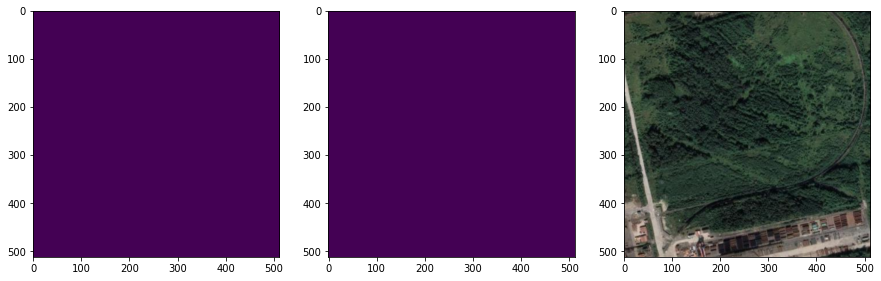

test_iou tensor(0.2395, device='cuda:0')
test_loss tensor(0.7319, device='cuda:0')
tensor(0.5781, device='cuda:0')


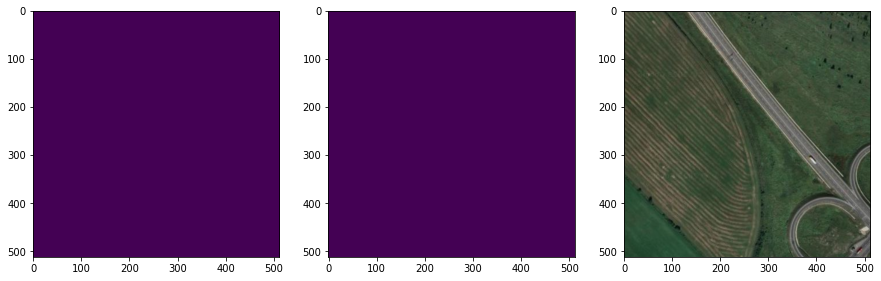

test_iou tensor(0.2931, device='cuda:0')
test_loss tensor(0.3469, device='cuda:0')
tensor(0.5785, device='cuda:0')


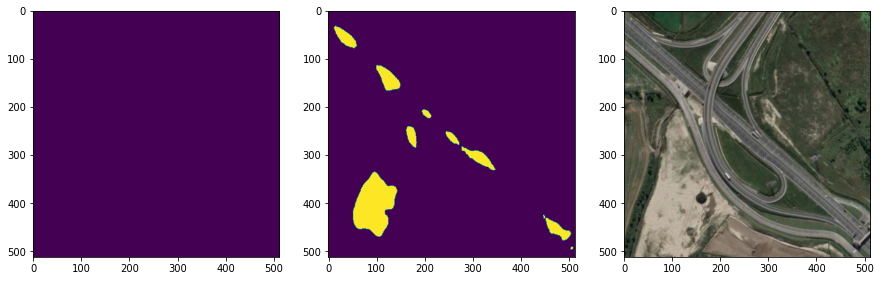

test_iou tensor(0.2241, device='cuda:0')
test_loss tensor(0.2006, device='cuda:0')
tensor(0.5790, device='cuda:0')


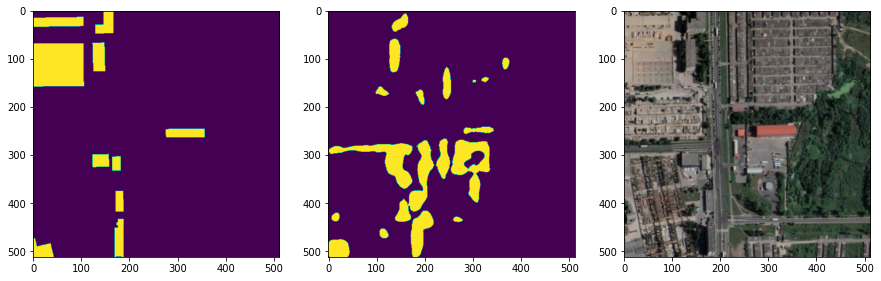

test_iou tensor(0.1445, device='cuda:0')
test_loss tensor(2.1067, device='cuda:0')
tensor(0.5790, device='cuda:0')


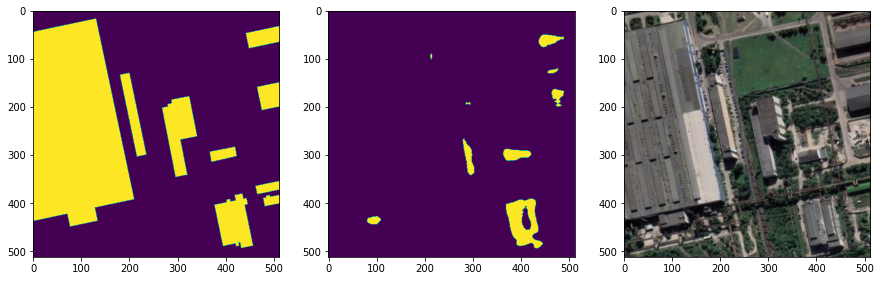

test_iou tensor(0.2999, device='cuda:0')
test_loss tensor(4.3890, device='cuda:0')
tensor(0.5790, device='cuda:0')


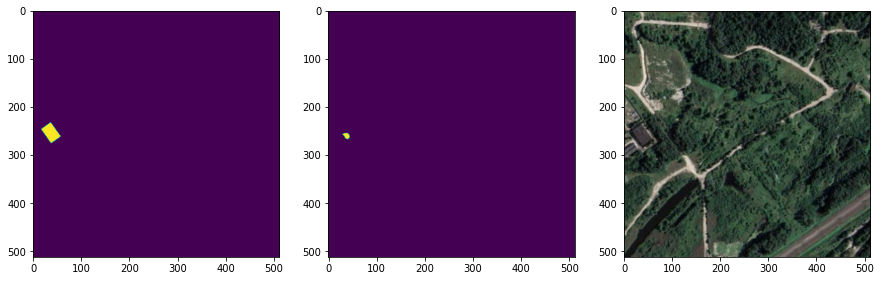

test_iou tensor(0.3825, device='cuda:0')
test_loss tensor(2.2562, device='cuda:0')
tensor(0.5792, device='cuda:0')


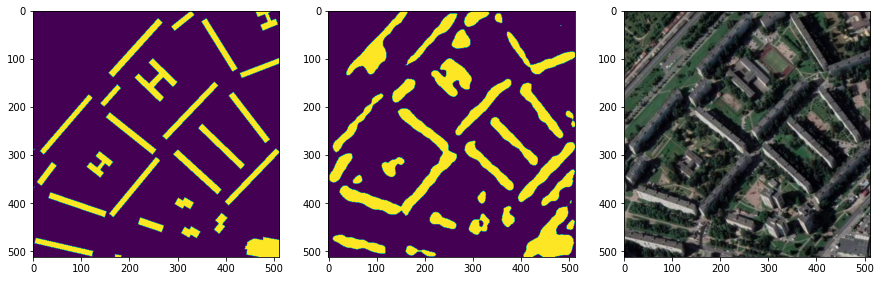

test_iou tensor(0.3228, device='cuda:0')
test_loss tensor(0.2624, device='cuda:0')
tensor(0.5799, device='cuda:0')


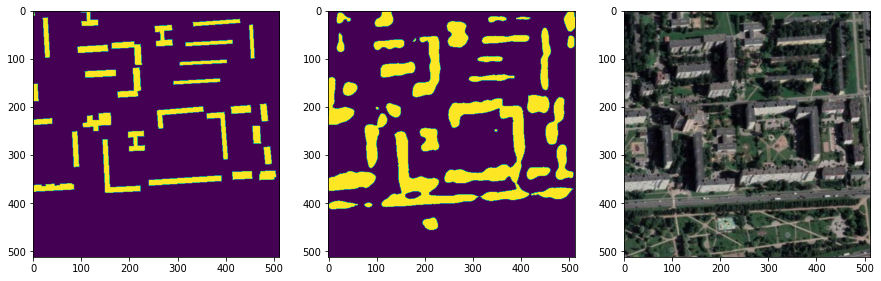

test_iou tensor(0.2554, device='cuda:0')
test_loss tensor(3.3163, device='cuda:0')
tensor(0.5802, device='cuda:0')


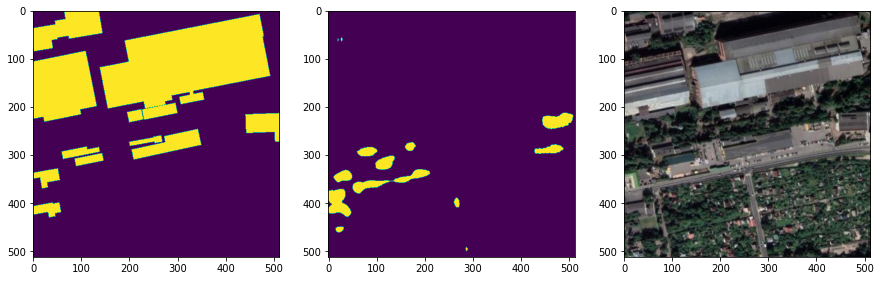

test_iou tensor(0.3239, device='cuda:0')
test_loss tensor(0.6744, device='cuda:0')
tensor(0.5806, device='cuda:0')


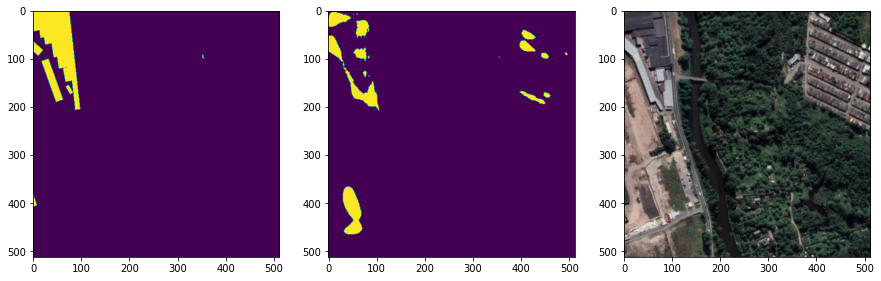

test_iou tensor(0.2383, device='cuda:0')
test_loss tensor(2.2805, device='cuda:0')
tensor(0.5807, device='cuda:0')


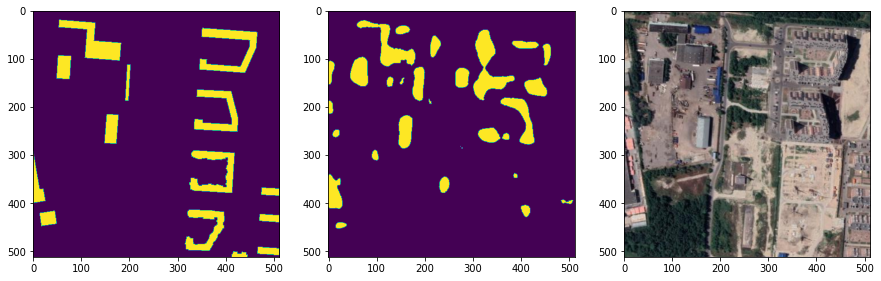

test_iou tensor(0.4192, device='cuda:0')
test_loss tensor(1.9209, device='cuda:0')
tensor(0.5807, device='cuda:0')


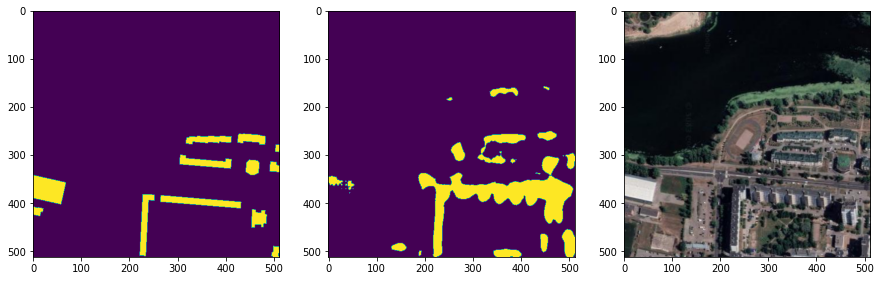

test_iou tensor(0.2666, device='cuda:0')
test_loss tensor(0.6467, device='cuda:0')
tensor(0.5811, device='cuda:0')


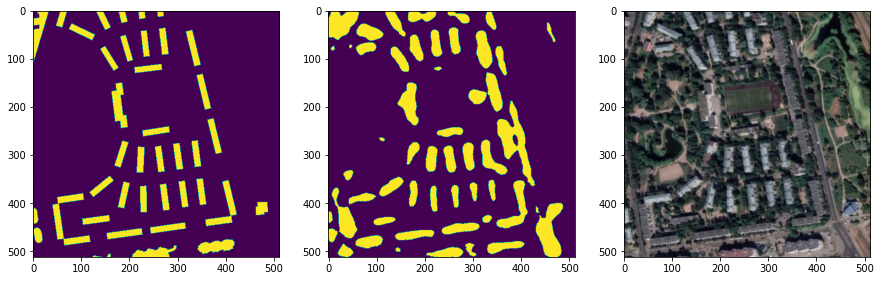

test_iou tensor(0.2744, device='cuda:0')
test_loss tensor(1.3347, device='cuda:0')
tensor(0.5814, device='cuda:0')


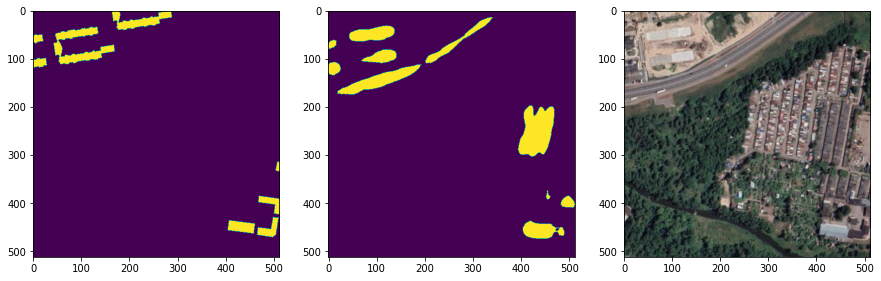

test_iou tensor(0.2069, device='cuda:0')
test_loss tensor(0.0240, device='cuda:0')
tensor(0.5814, device='cuda:0')


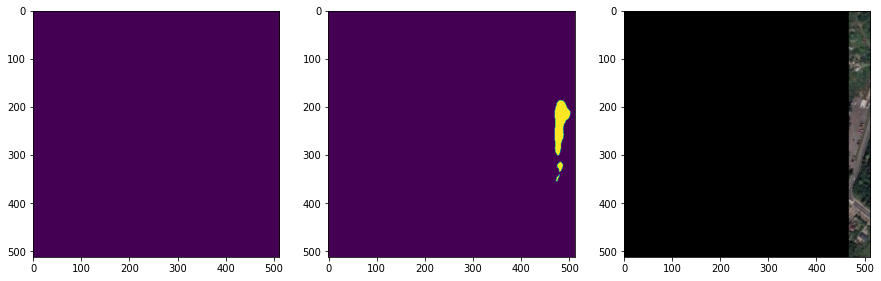

test_iou tensor(0.0262, device='cuda:0')
test_loss tensor(0.2278, device='cuda:0')
tensor(0.5816, device='cuda:0')


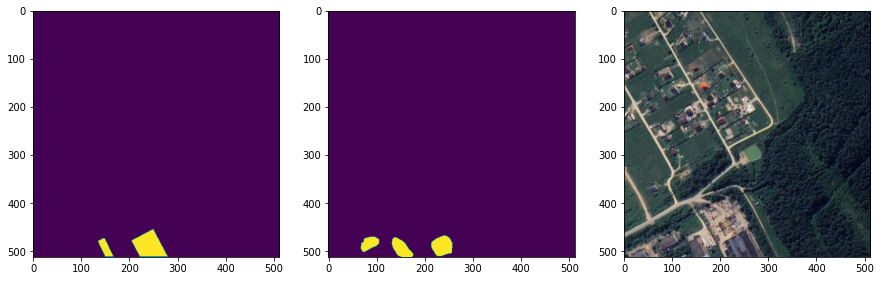

test_iou tensor(0.1513, device='cuda:0')
test_loss tensor(0.4075, device='cuda:0')
tensor(0.5818, device='cuda:0')


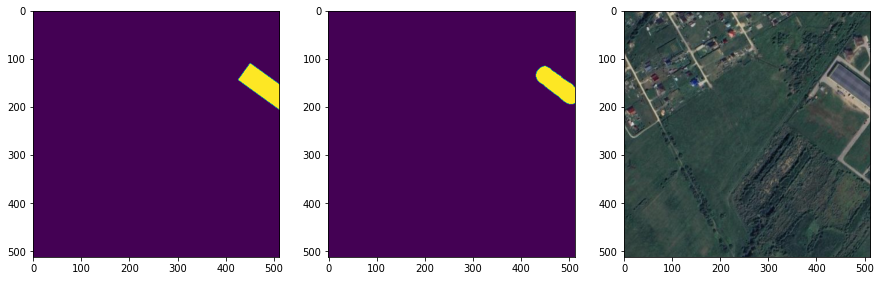

test_iou tensor(0.1826, device='cuda:0')
test_loss tensor(1.8943, device='cuda:0')
tensor(0.5817, device='cuda:0')


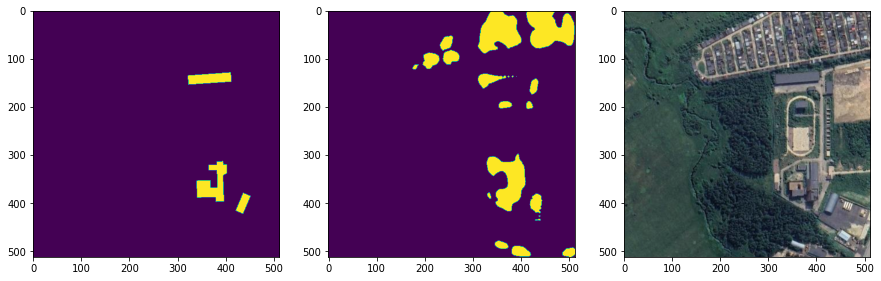

test_iou tensor(0.2786, device='cuda:0')
test_loss tensor(4.4240, device='cuda:0')
tensor(0.5815, device='cuda:0')


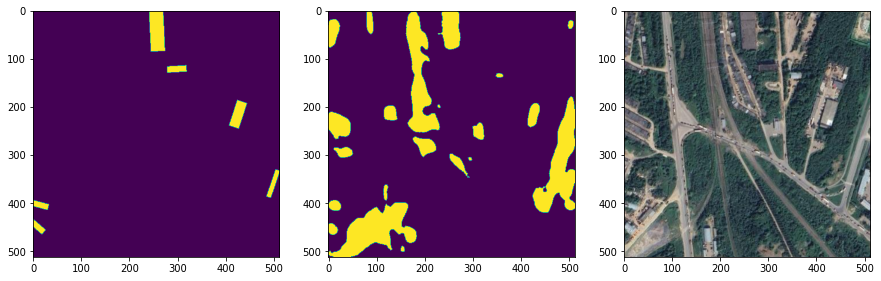

test_iou tensor(0.3196, device='cuda:0')
test_loss tensor(6.8523, device='cuda:0')
tensor(0.5812, device='cuda:0')


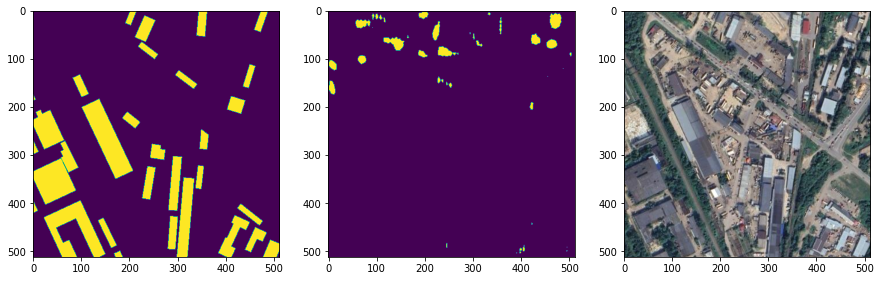

test_iou tensor(0.2895, device='cuda:0')
test_loss tensor(4.9583, device='cuda:0')
tensor(0.5810, device='cuda:0')


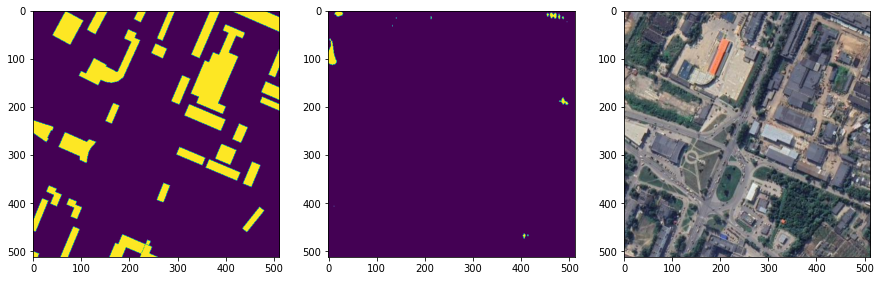

test_iou tensor(0.2687, device='cuda:0')
test_loss tensor(1.8566, device='cuda:0')
tensor(0.5808, device='cuda:0')


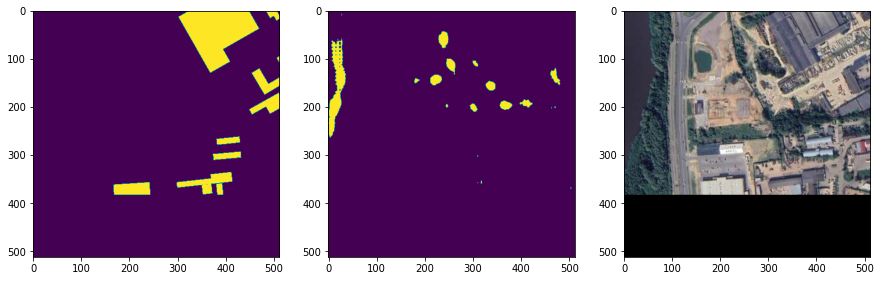

test_iou tensor(0.2883, device='cuda:0')
test_loss tensor(0.3638, device='cuda:0')
tensor(0.5805, device='cuda:0')


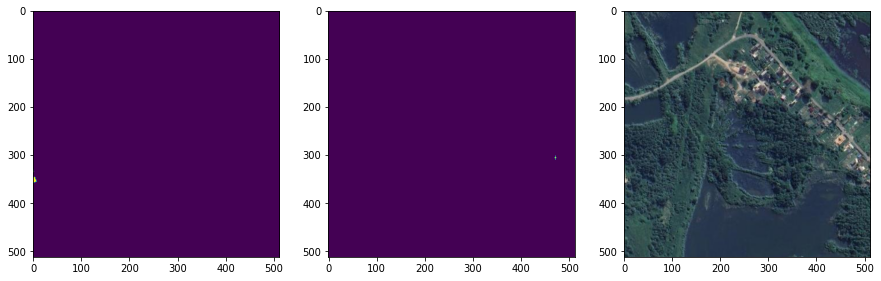

test_iou tensor(0.2558, device='cuda:0')
test_loss tensor(1.3331, device='cuda:0')
tensor(0.5803, device='cuda:0')


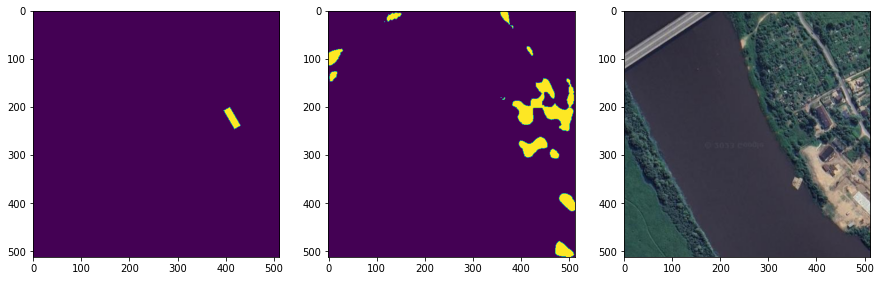

test_iou tensor(0.3114, device='cuda:0')
test_loss tensor(1.7309, device='cuda:0')
tensor(0.5802, device='cuda:0')


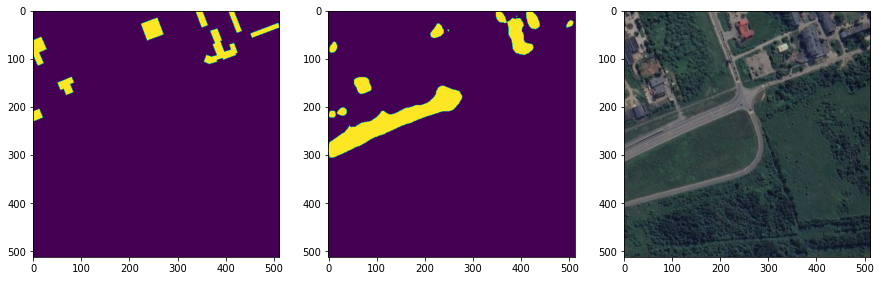

test_iou tensor(0.2517, device='cuda:0')
test_loss tensor(0.7885, device='cuda:0')
tensor(0.5801, device='cuda:0')


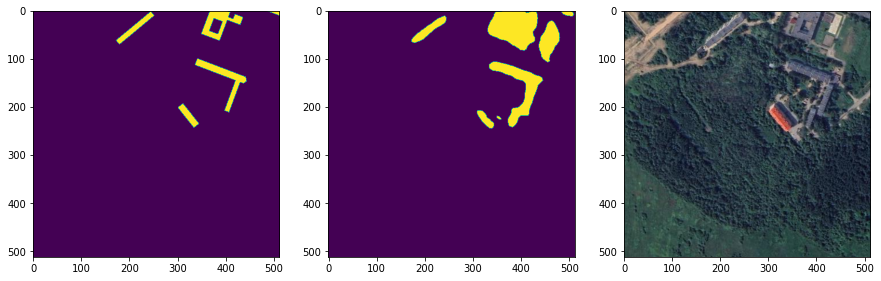

test_iou tensor(0.1456, device='cuda:0')
test_loss tensor(0.0453, device='cuda:0')
tensor(0.5805, device='cuda:0')


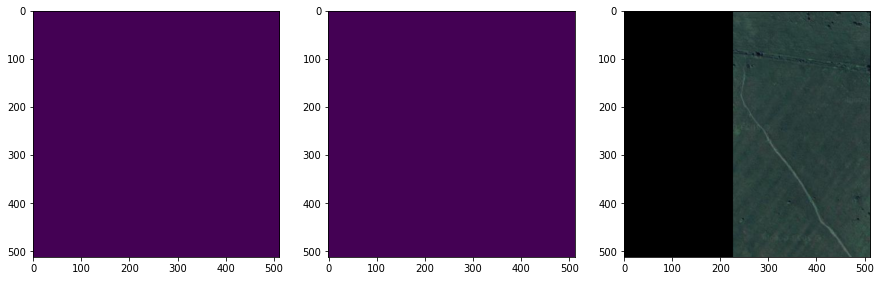

test_iou tensor(0.0651, device='cuda:0')


┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_iou          │    0.2534545063972473     │
│         test_loss         │    1.7632492780685425     │
└───────────────────────────┴───────────────────────────┘

[{'test_loss': 1.7632492780685425, 'test_iou': 0.2534545063972473}]

In [100]:

config = {
    "criterion_type": "ce",
    "optimizer_params": {
        "lr": 0.0001
    },
    "dataset_params": {
        "batch_size": 8,
    }
}

# Определите колбэк ModelCheckpoint
checkpoint_callback = ModelCheckpoint(
    monitor='val_loss',
    dirpath='/home/jupyter/datasphere/project/weights',
    filename='model-china-{epoch:02d}-{val_loss:.2f}',
    save_top_k=1,
    mode='min',
)


# module = ChaniseSatelliteDataset(config)
# model.model.load_state_dict(torch.load(saved_weights_path))

model = ChaniseSatelliteDataset.load_from_checkpoint(checkpoint_path='/home/jupyter/datasphere/project/weights/model-china-epoch=01-val_loss=0.21.ckpt')

#logger = pl.loggers.TensorBoardLogger("./logs", name='dice')
trainer = pl.Trainer(
    accelerator="gpu",#"gpu",
    #logger=logger,
    log_every_n_steps=10,
    max_epochs=3,
    default_root_dir="/home/jupyter/datasphere/project/",
    callbacks=[checkpoint_callback],
)
trainer.fit(module)
trainer.test()

In [21]:
picture = '/home/jupyter/datasphere/project/data/img/train_image_020.png'

In [92]:
class TestDataset(Dataset):
    def __init__(self, root_img, patch_size=(512, 512)):
        self.image_name = root_img            
        self.patch_size = patch_size
        self.image = Image.open(self.image_name).convert("RGB")
        self.post_transform = torchvision.transforms.ToTensor()

        self.image_patches = self._split_image_into_patches(self.image, self.patch_size)

        a = (self.image.size[0] + self.patch_size[0] - 1) // self.patch_size[0]
        b = (self.image.size[1] + self.patch_size[1] - 1) // self.patch_size[1]
        self.patches_count = a*b

    def print_mask(self, item):
        mask = Image.open(os.path.join(self.mask_dir, self.mask_names[item]))
        mask.show()

    def print_img(self, item):
        image = Image.open(os.path.join(self.image_dir, self.image_names[item]))
        image.show()
        
    def print_img_mask(self, item):
        image = Image.open(os.path.join(self.image_dir, self.image_names[item]))
        mask = Image.open(os.path.join(self.mask_dir, self.mask_names[item]))
        
        fig, axes = plt.subplots(1, 2, figsize=(12, 6))
        axes[0].imshow(image)
        axes[0].set_title('Image')
        axes[1].imshow(mask, cmap='gray')
        axes[1].set_title('Mask')
        plt.show()

    def print_mask_on_img(self, item):
        image_path = os.path.join(self.image_dir, self.image_names[item])
        mask_path = os.path.join(self.mask_dir, self.mask_names[item])
        image = Image.open(image_path).convert("RGB")
        mask = Image.open(mask_path).convert("L")
        mask = mask.resize(image.size, Image.NEAREST)
        mask_np = np.array(mask)
        cmap = plt.cm.get_cmap('viridis', 2)
        
        plt.figure(figsize=(10, 5))
        plt.imshow(image)
        plt.imshow(mask_np, cmap=cmap, alpha=0.5, vmin=0, vmax=1)
        plt.title("Image with Overlayed Mask")
        plt.axis("off")
        plt.show()
    
    def _split_image_into_patches(self, image, patch_size):

        image_patches = []

        for i in range(0, image.width, patch_size[0]):
            for j in range(0, image.height, patch_size[1]):
                patch_image = image.crop((i, j, i + patch_size[0], j + patch_size[1]))

                image_patches.append(patch_image)
        
        # возвращает списки патчей в формате Image
        return image_patches   
    
    def __getitem__(self, item):
        image_patch = np.array(self.image_patches[item])
        image_patch = self.post_transform(image_patch)
        
        return image_patch


    def __len__(self):
        # return len(self.image_names)
        return self.patches_count


In [87]:
##### OVERLAP
class TestDataset(Dataset):
    def __init__(self, root_img, patch_size=(512, 512), step=256):
        self.image_name = root_img            
        self.patch_size = patch_size
        self.image = Image.open(self.image_name).convert("RGB")
        self.post_transform = torchvision.transforms.ToTensor()
        self.step = step

        self.image_patches = self._split_image_into_patches(self.image, self.patch_size, self.step)

        a = (self.image.size[0] + self.step - 1) // self.step
        b = (self.image.size[1] + self.step - 1) // self.step
        self.patches_count = a*b

    def print_mask(self, item):
        mask = Image.open(os.path.join(self.mask_dir, self.mask_names[item]))
        mask.show()

    def print_img(self, item):
        image = Image.open(os.path.join(self.image_dir, self.image_names[item]))
        image.show()
        
    def print_img_mask(self, item):
        image = Image.open(os.path.join(self.image_dir, self.image_names[item]))
        mask = Image.open(os.path.join(self.mask_dir, self.mask_names[item]))
        
        fig, axes = plt.subplots(1, 2, figsize=(12, 6))
        axes[0].imshow(image)
        axes[0].set_title('Image')
        axes[1].imshow(mask, cmap='gray')
        axes[1].set_title('Mask')
        plt.show()

    def print_mask_on_img(self, item):
        image_path = os.path.join(self.image_dir, self.image_names[item])
        mask_path = os.path.join(self.mask_dir, self.mask_names[item])
        image = Image.open(image_path).convert("RGB")
        mask = Image.open(mask_path).convert("L")
        mask = mask.resize(image.size, Image.NEAREST)
        mask_np = np.array(mask)
        cmap = plt.cm.get_cmap('viridis', 2)
        
        plt.figure(figsize=(10, 5))
        plt.imshow(image)
        plt.imshow(mask_np, cmap=cmap, alpha=0.5, vmin=0, vmax=1)
        plt.title("Image with Overlayed Mask")
        plt.axis("off")
        plt.show()
    
    def _split_image_into_patches(self, image, patch_size, step):

        image_patches = []

        for i in range(0, image.width, step):
            for j in range(0, image.height, step):
                patch_image = image.crop((i, j, i + patch_size[0], j + patch_size[1]))

                image_patches.append(patch_image)
        
        # возвращает списки патчей в формате Image
        return image_patches   
    
    def __getitem__(self, item):
        image_patch = np.array(self.image_patches[item])
        image_patch = self.post_transform(image_patch)
        
        return image_patch


    def __len__(self):
        # return len(self.image_names)
        return self.patches_count


In [88]:
### OVERLAP
def get_final_prediction_overlap(picture):
    test_dataloader = torch.utils.data.DataLoader(TestDataset(picture), batch_size=8)
    predictions = trainer.predict(model, dataloaders=test_dataloader)
    
    for i in range(len(predictions)):
        predicted_masks = torch.argmax(predictions[i], dim=1)
        pred = predicted_masks.detach().cpu()
        predictions[i] = pred

    all_images = []
    to_pil = transforms.ToPILImage()

    for tensor in predictions:
        reshaped_tensor = tensor.view(-1, 512, 512).float()
        all_images.extend(reshaped_tensor)

    for i in range(len(all_images)):
        all_images[i] = all_images[i] / 255.0 #не видно но получаем предикт
        all_images[i] = to_pil(all_images[i])

    def reconstruct_mask(mask_patches, image_size = Image.open(picture).convert("RGB").size, patch_size=(512, 512), step=256):
        reconstructed_mask = np.zeros(image_size[::-1])

        index = 0
        for j in range(0, image_size[0], step):
            for i in range(0, image_size[1], step):
                patch_mask = np.array(mask_patches[index])
                
                tmp = reconstructed_mask[i:i+patch_size[0], j:j+patch_size[1]]
                
                patch_mask = patch_mask[:tmp.shape[0], :tmp.shape[1]]
                reconstructed_mask[i:i+patch_size[0], j:j+patch_size[1]] = np.maximum(tmp, patch_mask)
                index += 1

        return Image.fromarray(reconstructed_mask.astype('uint8'), 'L')

    
    tmp = reconstruct_mask(all_images)
    plt.imshow(tmp)
    
    filename = os.path.basename(picture)
    path_to_save = os.path.join('/home/jupyter/datasphere/project/answers', filename)
    tmp.save(path_to_save)


In [96]:
def get_final_prediction(picture):
    test_dataloader = torch.utils.data.DataLoader(TestDataset(picture), batch_size=8)
    predictions = trainer.predict(model, dataloaders=test_dataloader)
    
    for i in range(len(predictions)):
        predicted_masks = torch.argmax(predictions[i], dim=1)
        pred = predicted_masks.detach().cpu()
        predictions[i] = pred

    all_images = []
    to_pil = transforms.ToPILImage()

    for tensor in predictions:
        reshaped_tensor = tensor.view(-1, 512, 512).float()
        all_images.extend(reshaped_tensor)

    for i in range(len(all_images)):
        all_images[i] = all_images[i] / 255.0 #не видно но получаем предикт
        all_images[i] = to_pil(all_images[i])

    def reconstruct_mask(mask_patches, image_size = Image.open(picture).convert("RGB").size, patch_size=(512, 512)):
        reconstructed_mask = Image.new('L', image_size)
        index = 0

        for i in range(0, image_size[0], patch_size[0]):
            for j in range(0, image_size[1], patch_size[1]):
                patch_mask = mask_patches[index]
                reconstructed_mask.paste(patch_mask, (i, j))
                index += 1

        return reconstructed_mask

    tmp = reconstruct_mask(all_images)
    
    filename = os.path.basename(picture)
    path_to_save = os.path.join('/home/jupyter/datasphere/project/answers', filename)
    tmp.save(path_to_save)


In [97]:
get_final_prediction('/home/jupyter/datasphere/project/data/img/train_image_020.png')

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

In [25]:
test_dataloader = torch.utils.data.DataLoader(TestDataset(picture), batch_size=8)
predictions = trainer.predict(model, dataloaders=test_dataloader)

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

In [40]:
predictions[0].shape

torch.Size([8, 2, 512, 512])

In [41]:
len(predictions)

15

In [47]:
predictions[0][0]

tensor([[[ 2.1344,  2.1564,  2.1784,  ...,  2.0638,  2.0497,  2.0355],
         [ 2.0627,  2.0950,  2.1272,  ...,  2.0264,  2.0137,  2.0011],
         [ 1.9910,  2.0335,  2.0760,  ...,  1.9889,  1.9778,  1.9667],
         ...,
         [ 1.4830,  1.5132,  1.5435,  ...,  1.7391,  1.7126,  1.6861],
         [ 1.4173,  1.4417,  1.4661,  ...,  1.6843,  1.6687,  1.6532],
         [ 1.3516,  1.3701,  1.3887,  ...,  1.6295,  1.6249,  1.6202]],

        [[-2.1404, -2.1677, -2.1951,  ..., -1.9855, -1.9958, -2.0061],
         [-2.1515, -2.1638, -2.1762,  ..., -2.0337, -2.0133, -1.9929],
         [-2.1625, -2.1599, -2.1572,  ..., -2.0819, -2.0308, -1.9797],
         ...,
         [-1.4135, -1.4301, -1.4467,  ..., -1.6514, -1.6195, -1.5877],
         [-1.4048, -1.4131, -1.4214,  ..., -1.6640, -1.6277, -1.5914],
         [-1.3961, -1.3961, -1.3961,  ..., -1.6766, -1.6359, -1.5952]]])

In [55]:
for i in range(len(predictions)):
    predicted_masks = torch.argmax(predictions[i], dim=1)
    pred = predicted_masks.detach().cpu()
    predictions[i] = pred

In [67]:
# Предположим, что tensor_list - это ваш список тензоров
all_images = []
to_pil = transforms.ToPILImage()

for tensor in predictions:
    reshaped_tensor = tensor.view(-1, 512, 512).float()  # Преобразование тензора в размер (15*8, 512, 512)
    all_images.extend(reshaped_tensor)
    
print(all_images[0])
    
for i in range(len(all_images)):
    all_images[i] = to_pil(all_images[i])

tensor([[0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.]])


In [69]:
all_images

[<PIL.Image.Image image mode=L size=512x512>,
 <PIL.Image.Image image mode=L size=512x512>,
 <PIL.Image.Image image mode=L size=512x512>,
 <PIL.Image.Image image mode=L size=512x512>,
 <PIL.Image.Image image mode=L size=512x512>,
 <PIL.Image.Image image mode=L size=512x512>,
 <PIL.Image.Image image mode=L size=512x512>,
 <PIL.Image.Image image mode=L size=512x512>,
 <PIL.Image.Image image mode=L size=512x512>,
 <PIL.Image.Image image mode=L size=512x512>,
 <PIL.Image.Image image mode=L size=512x512>,
 <PIL.Image.Image image mode=L size=512x512>,
 <PIL.Image.Image image mode=L size=512x512>,
 <PIL.Image.Image image mode=L size=512x512>,
 <PIL.Image.Image image mode=L size=512x512>,
 <PIL.Image.Image image mode=L size=512x512>,
 <PIL.Image.Image image mode=L size=512x512>,
 <PIL.Image.Image image mode=L size=512x512>,
 <PIL.Image.Image image mode=L size=512x512>,
 <PIL.Image.Image image mode=L size=512x512>,
 <PIL.Image.Image image mode=L size=512x512>,
 <PIL.Image.Image image mode=L siz

In [46]:
Image.open(picture).convert("RGB").size

(5678, 4855)

In [45]:
image.size

(5678, 4855)

In [68]:
def reconstruct_mask(mask_patches, image_size = Image.open(picture).convert("RGB").size, patch_size=(512, 512)):
    reconstructed_mask = Image.new('L', image_size)
    index = 0

    for i in range(0, image_size[0], patch_size[0]):
        for j in range(0, image_size[1], patch_size[1]):
            patch_mask = mask_patches[index]
            reconstructed_mask.paste(patch_mask, (i, j))
            index += 1

    return reconstructed_mask


In [70]:
tmp = reconstruct_mask(all_images)

In [99]:
from PIL import Image
import numpy as np
from sklearn.metrics import f1_score

# Загрузите изображения
image1 = Image.open('/home/jupyter/datasphere/project/answers/train_image_020.png')
image2 = Image.open('/home/jupyter/datasphere/project/data/mask/train_mask_020.png')

# Преобразуйте изображения в массивы numpy
image1_np = np.array(image1)
image2_np = np.array(image2)

# unique_values_image1 = np.unique(image1_np)
# unique_values_image2 = np.unique(image2_np)

# print(f'Уникальные значения в первом массиве: {unique_values_image1}')
# print(f'Уникальные значения во втором массиве: {unique_values_image2}')

# Предположим, что изображения являются метками классов, преобразуйте их в одномерные массивы
image1_np = image1_np.flatten()
image2_np = image2_np.flatten()

# Вычислите F1 macro и micro score
f1_macro = f1_score(image1_np, image2_np, average='macro')
f1_micro = f1_score(image1_np, image2_np, average='micro')
f1 = f1_score(image1_np, image2_np)

print(f'F1 Score: {f1}')
print(f'F1 Macro Score: {f1_macro}')
print(f'F1 Micro Score: {f1_micro}')


F1 Score: 0.4576109264063302
F1 Macro Score: 0.7067609394877701
F1 Micro Score: 0.9184507768172437


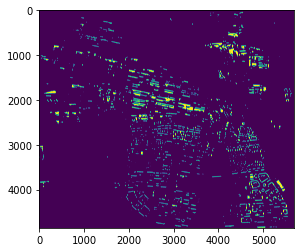

In [71]:
plt.imshow(tmp)

TypeError: Image data of dtype <U61 cannot be converted to float

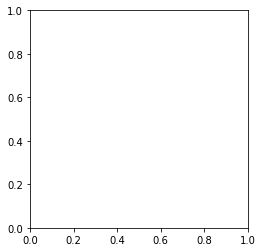

In [72]:
plt.imshow(picture)